In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
from sklearn.decomposition import NMF
from sklearn.decomposition import PCA
from sklearn import manifold
from sklearn import cluster
import sklearn.metrics
from sklearn.metrics.pairwise import pairwise_distances
from scipy.stats import entropy
from numpy.linalg import pinv
import operator
import itertools
import networkx as nx
from networkx.algorithms import bipartite
from sklearn.cluster.bicluster import SpectralCoclustering
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.cluster.hierarchy import *
import scipy.spatial.distance as ssd
import scipy
import colorsys

The purpose of this notebook is to create a pipeline for clustering cells based on their equivalence class counts and visualizing the produced labels. First, we define several helpful functions to easily do kmeans, spectral clustering, NMF, t-SNE, and a variety of distance functions (e.g. Shannon-Jensen).

In [51]:
# Functions that are helpful for analysis

# obtain labels via kmeans
def jz_kmeans(X,k,num_iter=50):
    k_means = cluster.KMeans(n_clusters=k,max_iter=num_iter,precompute_distances=True)
    k_means.fit(X)
    labels = k_means.labels_
    return labels

# obtain labels via spectral clustering
def jz_spectral(X,k,D):
    # Compute pairwise distances
    #D = pairwise_distances(X,metric=dist_funct,n_jobs=nj)
    if D[1,1] < 1: D = np.exp(-D**2) # Convert distance to similarity matrix
    spectral = cluster.SpectralClustering(n_clusters=k,affinity='precomputed')
    spectral.fit(D)
    labels = spectral.labels_
    return labels,D

# Hierarchical clustering (generate linkage matrix encoding hierarchical clustering result)
def jz_hierclust(D):
    D_sym = 0.5*D+0.5*D.T
    # convert the redundant n*n square matrix form into a condensed nC2 array
    # distArray[{n choose 2}-{n-i choose 2} + (j-i-1)] is the distance between points i and j
    distArray = ssd.squareform(D_sym)
    z = linkage(distArray,method='complete')
    return z

# Given a linkage matrix, return cluster labels (k clusters)
def jz_linkage_to_labels(z,k):
    return fcluster(z,k,criterion='maxclust')

# Bicluster matrix R into k clusters
def jz_bicluster(R,k):
    model = SpectralCoclustering(n_clusters=k, random_state=0)
    model.fit(R)
    plot_biclusters(R,model.row_labels_,model.column_labels_)
    return model.row_labels_,model.column_labels_

# Plot biclusters:
def plot_biclusters(R,row_labels,col_labels):
    fit_data = R[np.argsort(row_labels)]
    fit_data = fit_data[:, np.argsort(col_labels)]
    plt.figure(figsize=(15,10))
    plt.matshow(fit_data, cmap=plt.cm.Blues)
    plt.title("After biclustering; rearranged to show biclusters")
    plt.show()

# NMF
def jz_NMF(X,n_topics=9):
    nmf = NMF(n_components=n_topics)
    nmf.fit(X)
    pinv_of_dict=pinv(nmf.components_)
    NMF_rep = np.transpose(pinv_of_dict)*np.transpose(X)
    return np.transpose(NMF_rep)

# obtain two major directions from t-SNE
def jz_tSNE(X):
    tsne = manifold.TSNE(n_components=2, random_state=0);
    X_tsne = tsne.fit_transform(X);
    return X_tsne

# obtain two major directions from t-SNE
def tSNE_pairwise(D):
    tsne = manifold.TSNE(n_components=2, random_state=0, metric='precomputed', n_iter=2000);
    X_tsne = tsne.fit_transform(D);
    return X_tsne

# Distance metrics (input: X with m samples, output: m-by-m distance matrix)
def shannon_jensen(p, q):
    m=0.5*p+0.5*q
    p = np.transpose(p[p > 0])
    q = np.transpose(q[q > 0])
    m = np.transpose(m[m > 0])
    return np.sqrt(entropy(m)-0.5*entropy(q)-0.5*entropy(p))

# Plot function with colors corresponding to labels (first two columns of X)
def jz_plot(X,labels):
    unique_labels = np.unique(labels)
    plt.figure(figsize=(15,10))
    for label in unique_labels:
        ind = np.squeeze(labels == label)
        plt.scatter(X[ind,0],X[ind,1],c=np.random.rand(3))


# Plot function with (nonrandom) colors corresponding to labels (stain plots stars in a specific label)
def stain_plot(X,labels,stain):
    unique_labels = np.unique(labels)
    N = len(unique_labels)
    max_value = 16581375 #255**3
    interval = int(max_value / N)
    colors = [hex(I)[2:].zfill(6) for I in range(0, max_value, interval)]    
    color= [(int(i[:2], 16)/float(255), int(i[2:4], 16)/float(255), int(i[4:], 16)/float(255)) for i in colors]
    i=0;
    plt.figure(figsize=(15,10))
    for label in unique_labels:
        ind = np.squeeze(labels == label)
        if label in stain: 
            plt.scatter(X[ind,0],X[ind,1],c='red',s=186,edgecolors='black',lw = 0.5, alpha=1,marker='*',label=label)
        else:
            plt.scatter(X[ind,0],X[ind,1],c=color[i],s=36,edgecolors='gray',lw = 0.5,label=label)
        
        i=i+1

#Compute the error rates of two classification schemes.
#Rather than going over m! possibilities where m is the number of classes
#this uses the heuristic of comparing the i th largest cluster of on labeling scheme
#with the i th largest cluster of the other labelling scheme
def compare_labels(label1, label2):
    # quality control.. make sure inputs are np arrays and their lengths are equal
    nplabel1=np.array(label1)
    nplabel2=np.array(label2)
    assert len(label1)==len(label2)
    unique_labels1=np.unique(nplabel1)
    unique_labels2=np.unique(nplabel2)
    # Create two dictionaries that count the number of each unique label in the two label sets
    num_entries1={}
    num_entries2={}
    for label in unique_labels1:
        num_entries1[label] = len(nplabel1[nplabel1==label])
    for label in unique_labels2:
        num_entries2[label] = len(nplabel2[nplabel2==label])
    sorted_label1 = sorted(num_entries1.items(), key=operator.itemgetter(1))
    sorted_label2 = sorted(num_entries2.items(), key=operator.itemgetter(1))
    # Find and return the sum of the differences between the ith largest labelings for label1, label2
    difference=0
    for index in xrange(len(sorted_label1)):
         set1= set(np.flatnonzero(nplabel1==sorted_label1[index][0]))
         set2= set(np.flatnonzero(nplabel2==sorted_label2[index][0]))
         difference+=len(set1.symmetric_difference(set2))
    return difference/2

#gets max weight matching of a biparetite graph with row_label x column_label
#where the weight is given by the weight_matrix
def get_max_wt_matching(row_label,column_label, weight_matrix):
    # Create a bipartite graph where each group has |unique labels| nodes
    G = nx.complete_bipartite_graph(len(row_label), len(column_label))
    # Weight each edge by the weight in weight  matrix.. 
    for u,v in G.edges():
        G[u][v]["weight"]=weight_matrix[u,v-len(row_label)]
    # Perform weight matching using Kuhn Munkres
    H=nx.max_weight_matching(G)
    max_wt=0
    for u,v in H.items():
        max_wt+=G[u][v]["weight"]/float(2)
    return max_wt

#Plot heatmap
def get_heatmap(data_matrix, row_labels, column_labels, ttl):
    plt_shape = (int(data_matrix.shape[0]*1.25),data_matrix.shape[1])
    fig, ax = plt.subplots(figsize=plt_shape)
    heatmap = ax.pcolor(data_matrix, cmap=plt.cm.Blues)
    # put the major ticks at the middle of each cell
    ax.set_xticks(np.arange(data_matrix.shape[0])+0.5, minor=False)
    ax.set_yticks(np.arange(data_matrix.shape[1])+0.5, minor=False)
    # want a more natural, table-like display
    ax.invert_yaxis()
    ax.xaxis.tick_top()
    ax.set_xticklabels(row_labels, minor=False)
    ax.set_yticklabels(column_labels, minor=False)
    plt.title(ttl+"\n",fontsize=14)
    plt.colorbar(heatmap)
    plt.show()
    
def analyse_labeling_schemes(label1, label2):
    # quality control.. make sure inputs are np arrays and their lengths are equal
    nplabel1=np.array(label1)
    nplabel2=np.array(label2)
    assert len(label1)==len(label2)
    unique_labels1=np.unique(nplabel1)
    unique_labels2=np.unique(nplabel2)
    # Create two dictionaries. Each will store the indices of each label
    entries1={}
    entries2={}
    for label in unique_labels1:
        entries1[label] = set(np.flatnonzero((nplabel1==label)))
    for label in unique_labels2:
        entries2[label] = set(np.flatnonzero((nplabel2==label)))
    # Create an intersection matrix which counts the number of entries that overlap for each label combination
    intersection_matrix=np.zeros((len(unique_labels1),len(unique_labels2)))
    for ind1,ind2 in itertools.product(range(len(unique_labels1)),range(len(unique_labels2))):
        intersection_matrix[ind1,ind2]=len(entries1[unique_labels1[ind1]].
                                               intersection(entries2[unique_labels2[ind2]]))
    # Plot a heatmap of the intersection matrix
    get_heatmap(intersection_matrix, unique_labels1, unique_labels2, 
                'Unnormalised heatmap of intersection of labels')
    get_heatmap(intersection_matrix/intersection_matrix.sum(axis=0), 
                unique_labels1, unique_labels2, 
               'Heatmap of intersection of labels normalised by labels along columns')
    get_heatmap((intersection_matrix.T/intersection_matrix.sum(axis=1)).T, 
                unique_labels1, unique_labels2,
               'Heatmap of intersection of labels normalised by labels along rows')
    # Print various error rates
    print "Error rates if best cluster index is picked row-wise : " + str(
        (1- sum(np.max(intersection_matrix, axis=0))/float(len(label1)))*100) + "%."
    print "Error rates if best cluster index is picked column-wise : " + str(
        (1- sum(np.max(intersection_matrix, axis=1))/float(len(label1)))*100) + "%."
    print "Error rates if best cluster index is picked using the Hungarian Algorithm : " + str(
        (1- get_max_wt_matching(unique_labels1,
                                unique_labels2,intersection_matrix)
         /float(len(label1)))*100) + "%."
def vn_AffinityProp(D):
    aff= cluster.AffinityPropagation(affinity='precomputed')
    labels=aff.fit_predict(D)
    return labels
# Plot function with Zeisel colors corresponding to labels (first two columns of X)
def tru_plot9(X,labels,tru_color,name_of_clustID):
    
    unique_labels = np.unique(labels)
    plt.figure(figsize=(15,10))
    for label in unique_labels:
        ind = np.squeeze(labels == label)
        plt.scatter(X[ind,0],X[ind,1],c=tru_color[label.astype(int)],s=36,edgecolors='gray',lw = 0.5, label=name_of_clustID[label.astype(int)])        
    plt.legend(loc='upper right',bbox_to_anchor=(1.1, 1))
    

First, load the data. We use Zeisel et al.'s 3005 brain cells. There should be 342812 equivalence classes total. (Initial processing with Kallisto already done).

In [41]:
# Load data
with open('/data/SS_RNA_seq/Code/sparse_eq_class.dat', 'rb') as infile:
    X = pickle.load(infile)
truth_9 = np.loadtxt('/data/SS_RNA_seq/Code/clustering_on_reads/Zeisel_metadata/cell_group_num_3005.txt',dtype=str)
truth_47 = np.loadtxt('/data/SS_RNA_seq/Code/clustering_on_reads/Zeisel_metadata/cell_subclass_3005.txt',dtype=str)
truth_tissue = np.loadtxt('/data/SS_RNA_seq/Code/clustering_on_reads/Zeisel_metadata/cell_tissue_3005.txt',dtype=str)

# Load precomputed jensen_shannon distance matrix
with open('/data/SS_RNA_seq/Code/pairwise_jensen_shannon_divergence.dat', 'rb') as infile:
    D = pickle.load(infile)

# Sanity checks on dimensions of loaded data:
print np.shape(X)
print np.shape(D)
print len(truth_9)

(3005, 342812)
(3005, 3005)
3005


In [1]:
plt.figure(figsize=(15,10))
plt.imshow(D)

NameError: name 'plt' is not defined

## Compute t-SNE 

Running t-SNE on the entire data (used L2 norm by default, not recommended)

In [63]:
X_tsne = jz_tSNE(X)

Running t-SNE on the precomputed Jensen-Shannon distance matrix


In [22]:
X_tsne = tSNE_pairwise(D)

In [16]:
#save Xtsne (optional)
with open('/data/SS_RNA_seq/Code/good_looking_tSNE.dat','wb') as outfile:
    pickle.dump(X_tsne, outfile, pickle.HIGHEST_PROTOCOL)

In [10]:
#load Xtsne (optional)
with open('/data/SS_RNA_seq/Code/good_looking_tSNE.dat', 'rb') as infile:
    X_tsne = pickle.load(infile)

## First few plots: 
t-SNE on the data (eq.class distributions) with labels provided by Zeisel et.al.

In [53]:
%matplotlib inline

# Plot function with Zeisel colors corresponding to labels (first two columns of X)
def tru_plot9(X,labels,tru_color,name_of_clustID):
    
    unique_labels = np.unique(labels)
    plt.figure(figsize=(15,10))
    for label in unique_labels:
        ind = np.squeeze(labels == label)
        plt.scatter(X[ind,0],X[ind,1],c=tru_color[label.astype(int)],s=36,edgecolors='gray',lw = 0.5, label=name_of_clustID[label.astype(int)])        
    plt.legend(loc='upper right',bbox_to_anchor=(1.1, 1))
    

#cell names and colors for 9 clusters
name_of_clustID ={}
color_of_clustID ={}
name_of_clustID[1] = 'Interneurons'
name_of_clustID[2] = 'S1 Pyrimidal'
name_of_clustID[3] = 'CA1 Pyrimidal'
name_of_clustID[4] = 'Oligodentrocytes'
name_of_clustID[5] = 'Microglia'
name_of_clustID[6] = 'Endothelial'
name_of_clustID[7] = 'Astrocytes'
name_of_clustID[8] = 'Ependymal'
name_of_clustID[9] = 'Mural'

color_of_clustID[1] = 'red'
color_of_clustID[2] = 'cornflowerblue'
color_of_clustID[3] = 'darkblue'
color_of_clustID[4] = 'deeppink'
color_of_clustID[5] = 'lime'
color_of_clustID[6] = 'peru'
color_of_clustID[7] = 'darkorchid'
color_of_clustID[8] = 'lavender'
color_of_clustID[9] = 'khaki'

t-SNE on equivalence classes, labeled using the 9 classes provided by the authors

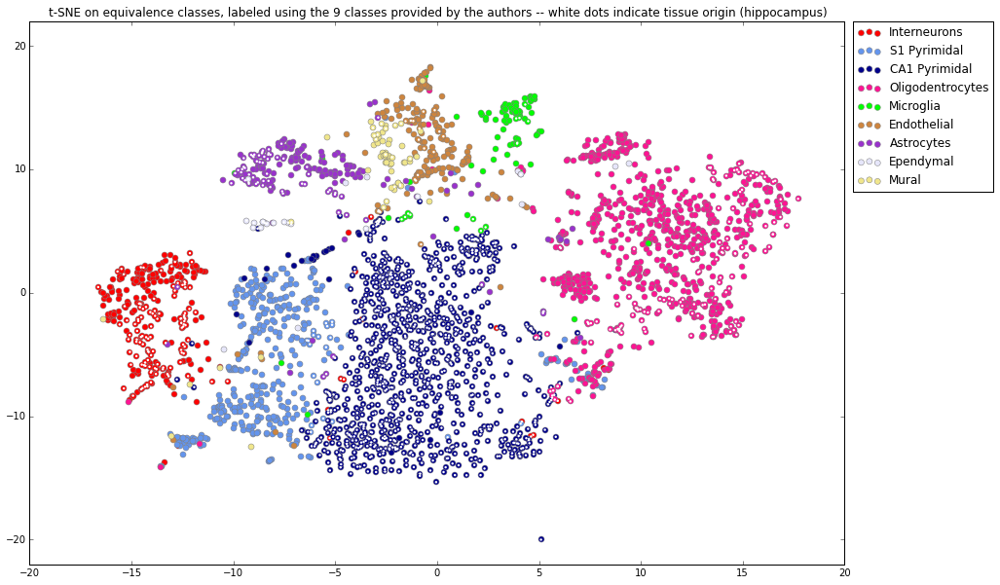

In [99]:
tru_plot9(X_tsne,truth_9,color_of_clustID,name_of_clustID)
ind = np.squeeze(truth_tissue == 'ca1hippocampus')
plt.legend(loc='upper right',bbox_to_anchor=(1.19, 1.01))
plt.xlim(-20, 20)
plt.ylim(-22, 22)
plt.scatter(X_tsne[ind,0],X_tsne[ind,1],c='white',alpha=1,s=6,edgecolors = 'none')
plt.title('t-SNE on equivalence classes, labeled using the 9 classes provided by the authors -- white dots indicate tissue origin (hippocampus)')



t-SNE on equivalence classes with 47 labels determined by authors. 

(-22, 22)

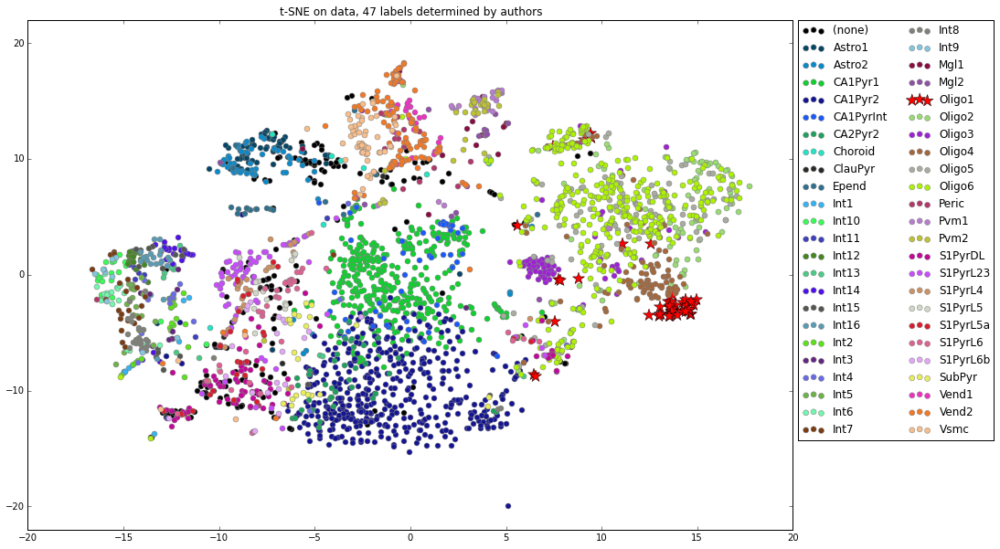

In [97]:
stain_label='Oligo1'
stain_plot(X_tsne,truth_47,stain_label)
plt.title('t-SNE on equivalence classes with 47 labels determined by authors')
plt.legend(loc='upper right',bbox_to_anchor=(1.27, 1.01),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

## Non-negative Matrix Factrization
Perform NMF with two topics on the dataset

In [38]:
%matplotlib inline
X_NMF = jz_NMF(X,n_topics=2)

We separate the cells of types 1-3, from those of types 4-9. The clusters obtained are as shown 

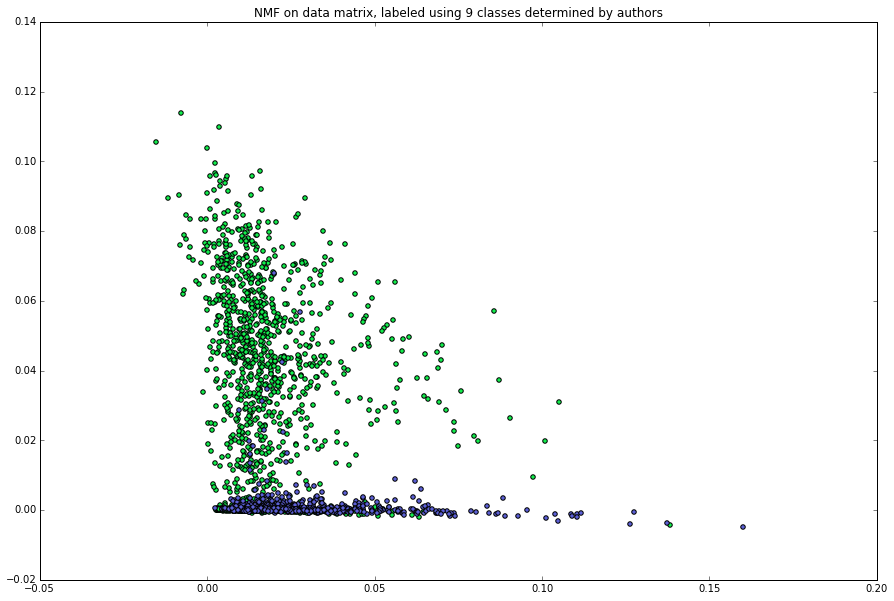

In [84]:
truth_s4=np.loadtxt('/data/SS_RNA_seq/Code/clustering_on_reads/metadata/cell_group_num_3005.txt',dtype=str)
truth_s4[truth_s4<='4']='0'
truth_s4[truth_s4>'4']='1'
jz_plot(X_NMF,truth_s4)
plt.title('NMF on data matrix, labeled using 9 classes determined by authors')

This clustering makes sense when viewing the bar chart from the paper which shows that the first 3 types of cells are much closer than the other 6 classes

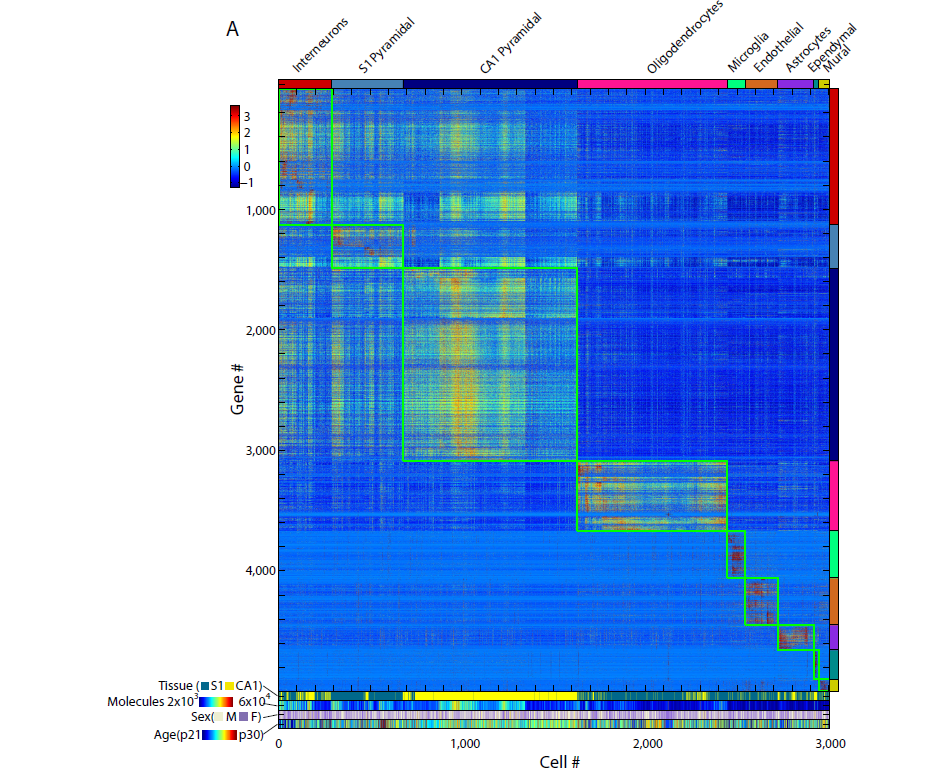

In [86]:
from IPython.display import Image
Image('Zeisel.png')

## Spectral Clustering on Equivalence Classes (using Jensen-Shannon distance metric)
Generate spectral clustering labels for k=2 and k=9. For the distance matrix we choose to use the square root of Jensen-Shannon divergence for computing pairwise eq. class distribution distances.

In [ ]:
# Load precomputed distance matrix
with open('/data/SS_RNA_seq/Code/pairwise_jensen_shannon_divergence.dat', 'rb') as infile:
    D = pickle.load(infile)
# Spectral clustering for k=2
labels_spectral_2, similarity_matrix_l1=jz_spectral(X,2,D)

In [56]:
# Spectral clustering for k=9
labels_spectral_9, similarity_matrix_l1=jz_spectral(X,9,D)

First try 2 clusters and compare with the clusters obtained by authors' [cell types 1-3] vs [cell types 4-9]

(-22, 22)

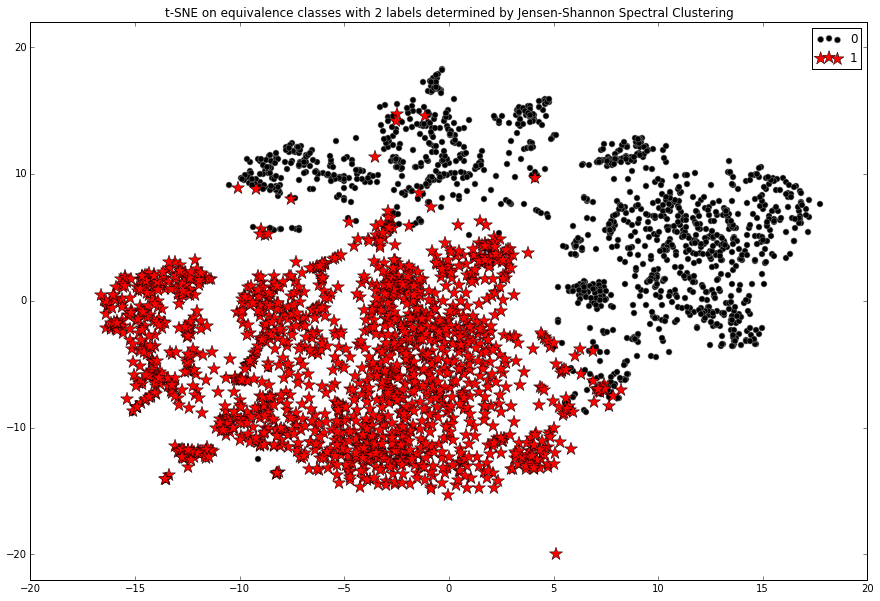

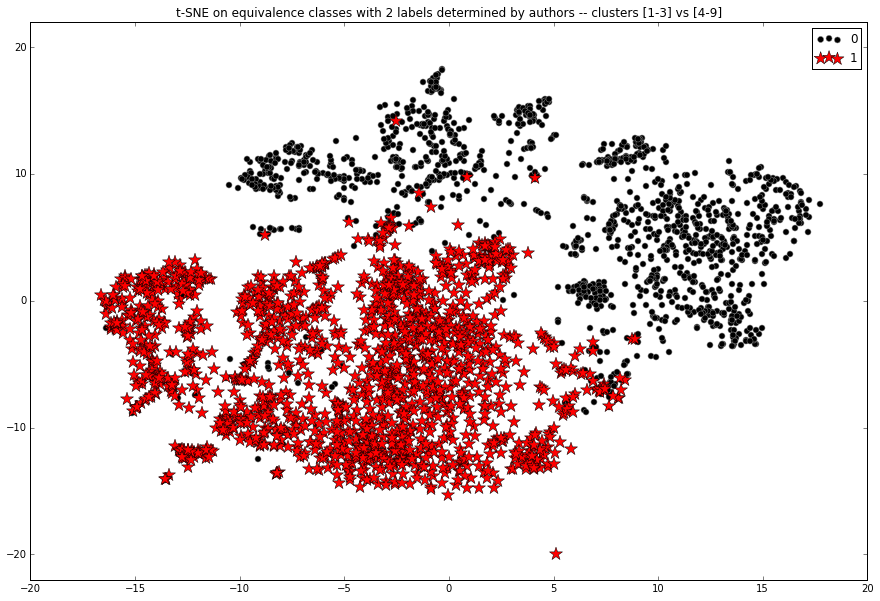

In [110]:
#separate true labels 
truth_ge4=np.ones(truth_9.shape)
truth_ge4[truth_9>='4']=0


#Plot spectral clustering for 2 clusters 
stain_plot(X_tsne,labels_spectral_2,[1])
plt.title('t-SNE on equivalence classes with 2 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

#Plot spectral [cell types 1-3] vs [cell types 4-9]
stain_plot(X_tsne,truth_ge4.astype(int),[1])
plt.title('t-SNE on equivalence classes with 2 labels determined by authors -- [cell types 1-3] vs [cell types 4-9]')
plt.legend(loc='upper right',bbox_to_anchor=(1, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

We now compute the error rates that the spectral clustering obtains when clustering classes 1-3 from classes 4-9. 

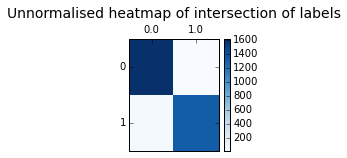

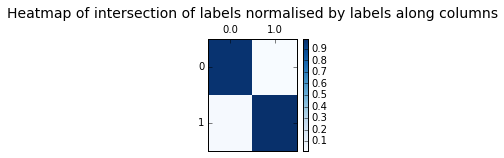

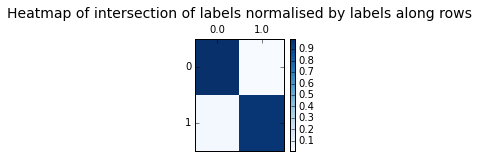

Error rates if best cluster index is picked row-wise : 2.26289517471%.
Error rates if best cluster index is picked column-wise : 2.26289517471%.
Error rates if best cluster index is picked using the Hungarian Algorithm : 2.26289517471%.


In [162]:
analyse_labeling_schemes(truth_ge4,labels_spectral_2)

Spectral clustering with 9 clusters

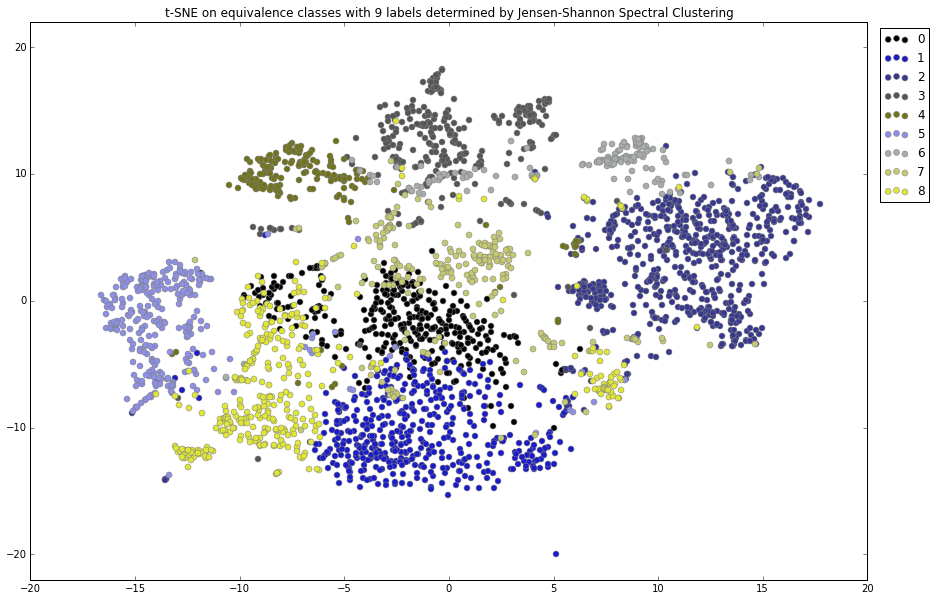

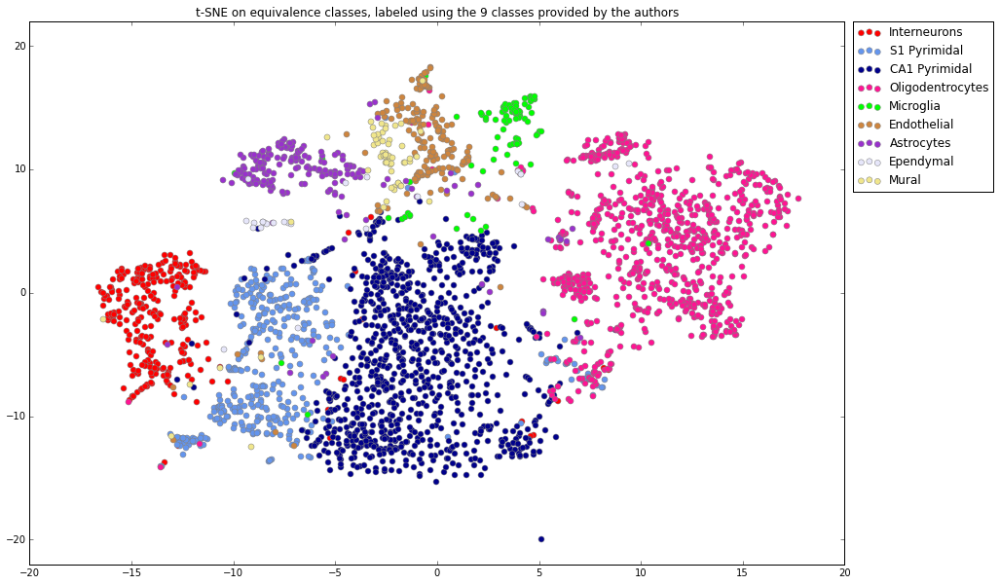

In [116]:
#Plot spectral clustering for 9 clusters


stain_plot(X_tsne,labels_spectral_9,[])
plt.title('t-SNE on equivalence classes with 9 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)


tru_plot9(X_tsne,truth_9,color_of_clustID,name_of_clustID)
plt.legend(loc='upper right',bbox_to_anchor=(1.19, 1.01))
plt.xlim(-20, 20)
plt.ylim(-22, 22)
plt.title('t-SNE on equivalence classes, labeled using the 9 classes provided by the authors')




We now compute the error rates that the spectral clustering obtains when clustering all 9 classes.

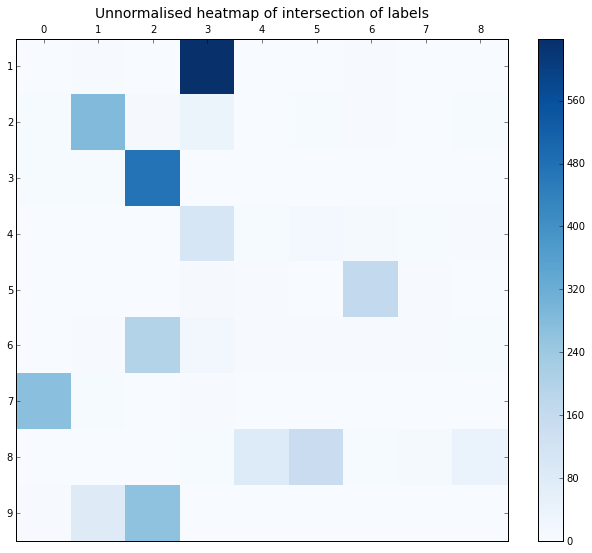

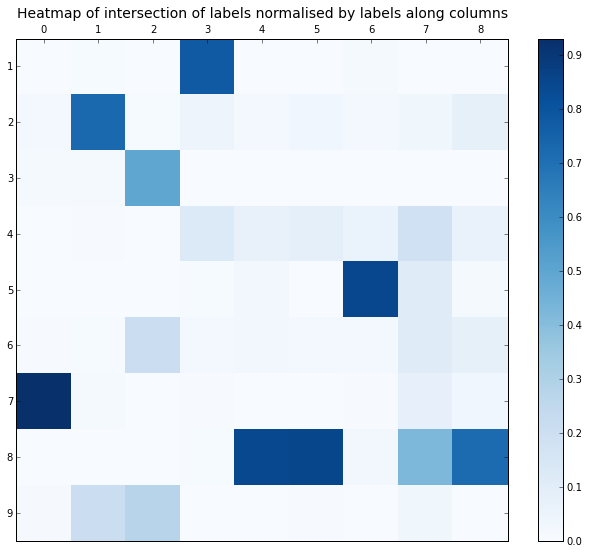

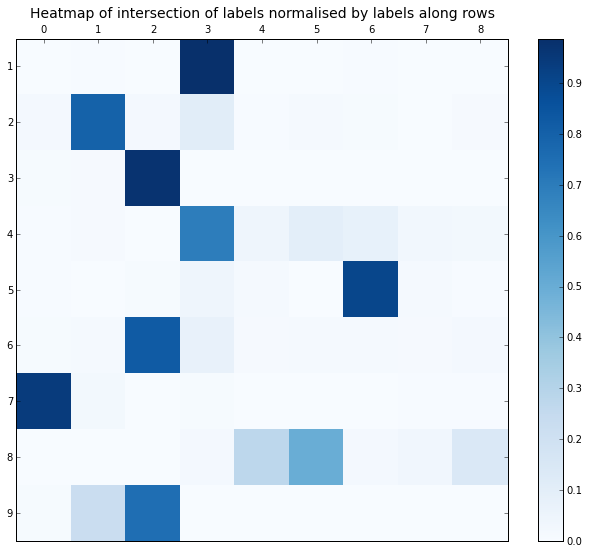

Error rates if best cluster index is picked row-wise : 29.4176372712%.
Error rates if best cluster index is picked column-wise : 15.1081530782%.
Error rates if best cluster index is picked using the Hungarian Algorithm : 33.544093178%.


In [105]:
analyse_labeling_schemes(labels_spectral_9,truth_9)

## Analysis with more than 9 clusters

JS Spectral with 12 labels

In [120]:
# Spectral clustering for k=10
labels_spectral_10, similarity_matrix_l1=jz_spectral(X,10,D)

In [121]:
# Spectral clustering for k=11
labels_spectral_11, similarity_matrix_l1=jz_spectral(X,11,D)

In [117]:
# Spectral clustering for k=12
labels_spectral_12, similarity_matrix_l1=jz_spectral(X,12,D)

In [122]:
# Spectral clustering for k=13
labels_spectral_13, similarity_matrix_l1=jz_spectral(X,13,D)

In [125]:
# Spectral clustering for k=14
labels_spectral_14, similarity_matrix_l1=jz_spectral(X,14,D)

In [126]:
# Spectral clustering for k=15
labels_spectral_15, similarity_matrix_l1=jz_spectral(X,15,D)

In [127]:
# Spectral clustering for k=16
labels_spectral_16, similarity_matrix_l1=jz_spectral(X,16,D)

In [129]:

# Spectral clustering for k=17-25
labels_spectral_17, similarity_matrix_l1=jz_spectral(X,17,D)
labels_spectral_18, similarity_matrix_l1=jz_spectral(X,18,D)
labels_spectral_19, similarity_matrix_l1=jz_spectral(X,19,D)
labels_spectral_20, similarity_matrix_l1=jz_spectral(X,20,D)
labels_spectral_21, similarity_matrix_l1=jz_spectral(X,21,D)
labels_spectral_22, similarity_matrix_l1=jz_spectral(X,22,D)
labels_spectral_23, similarity_matrix_l1=jz_spectral(X,23,D)
labels_spectral_24, similarity_matrix_l1=jz_spectral(X,24,D)
labels_spectral_25, similarity_matrix_l1=jz_spectral(X,25,D)

In [ ]:
labels_spectral_47, similarity_matrix_l1=jz_spectral(X,47,D)

In [15]:
labels_affinity=vn_AffinityProp(np.exp(-1 * D / D.std()))

(-22, 22)

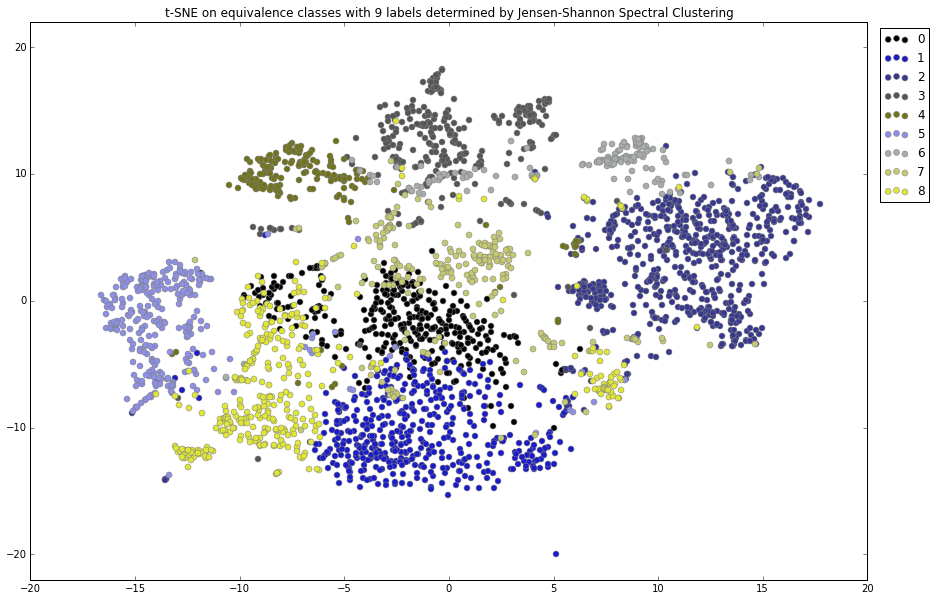

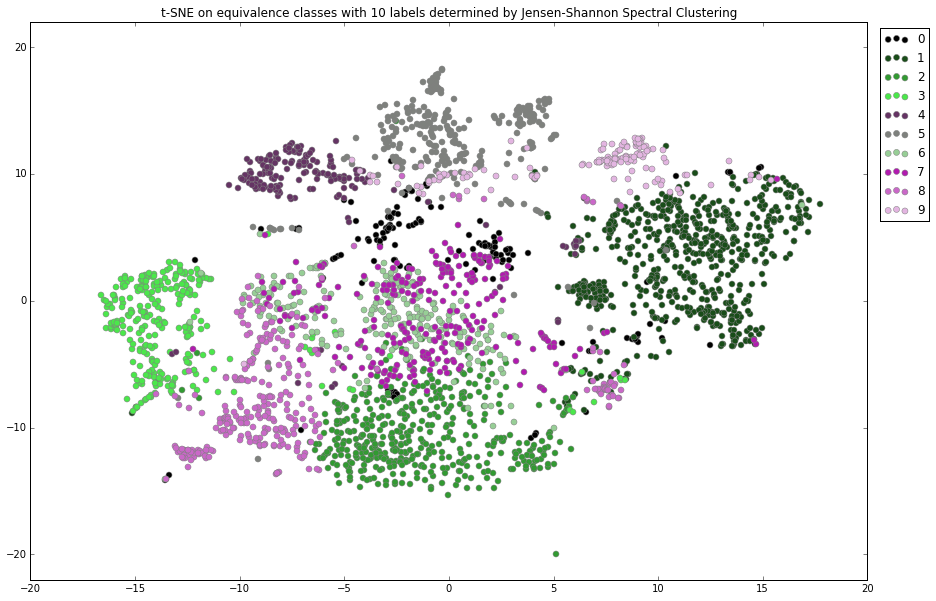

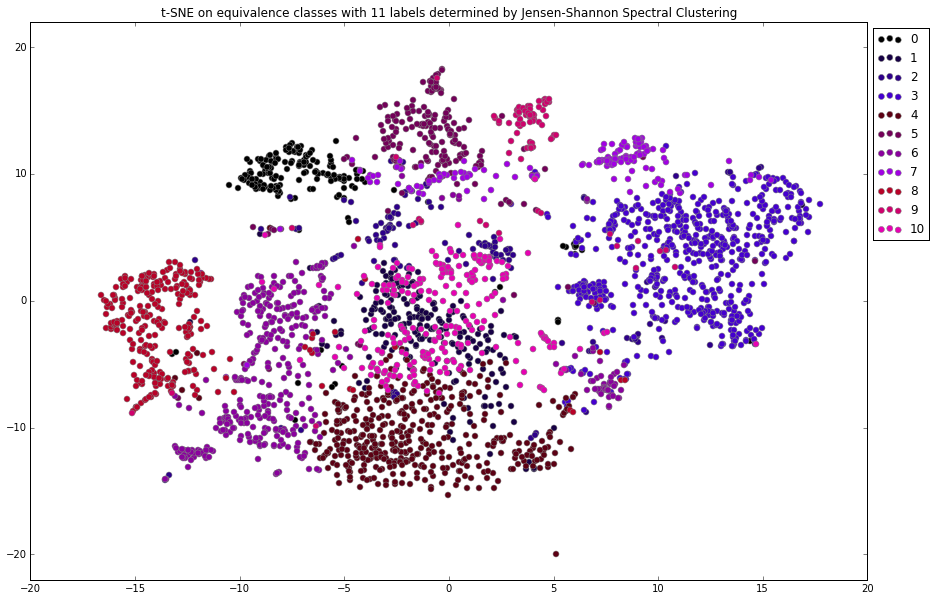

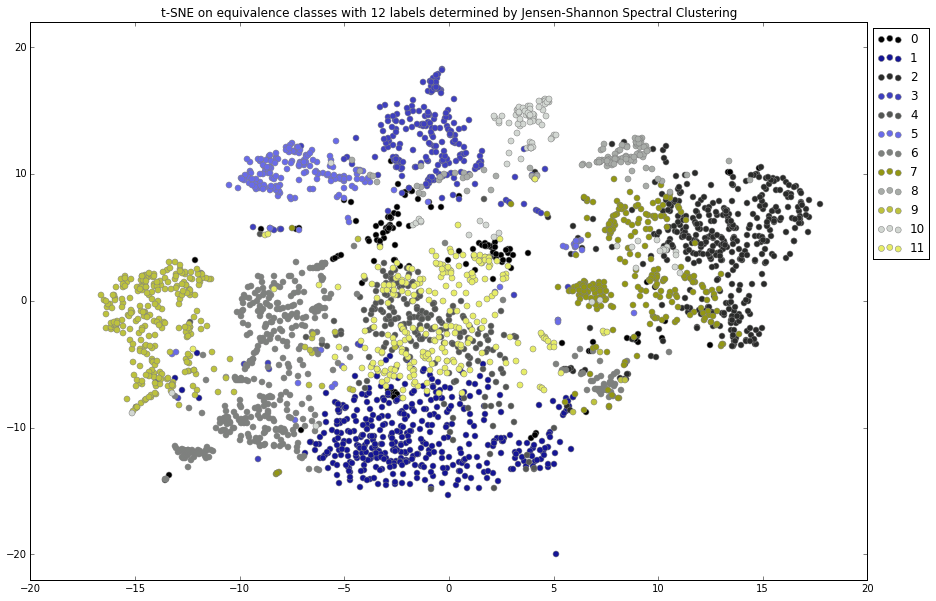

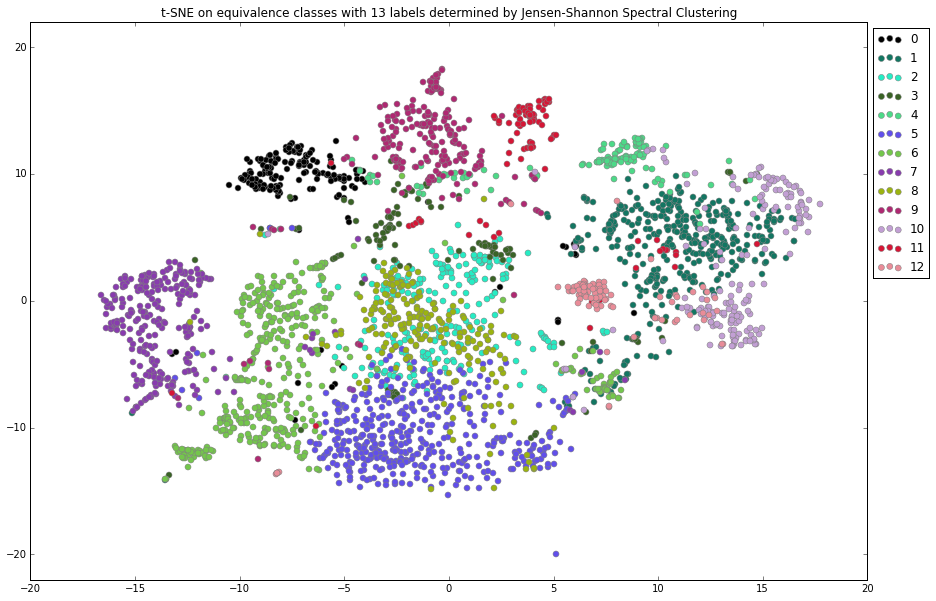

...

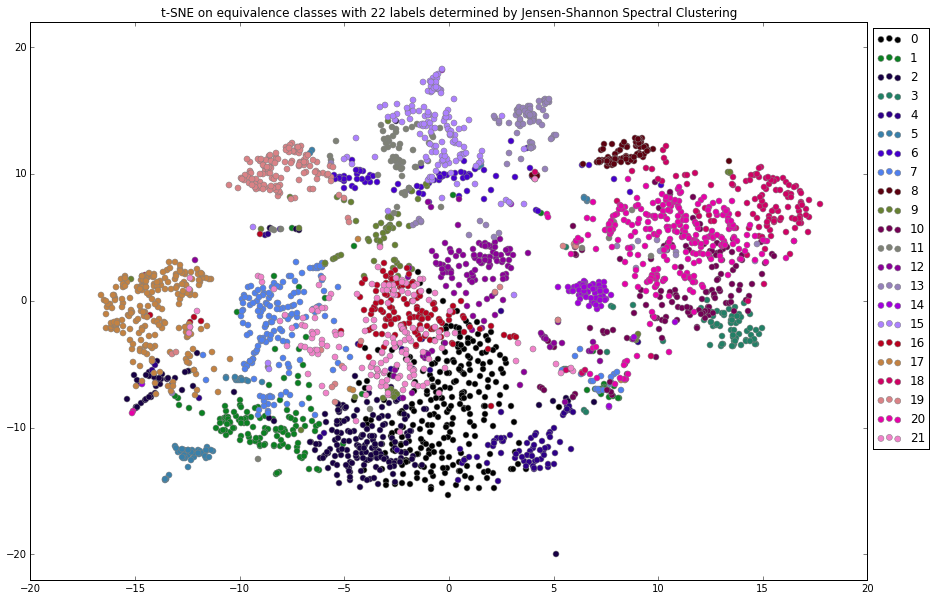

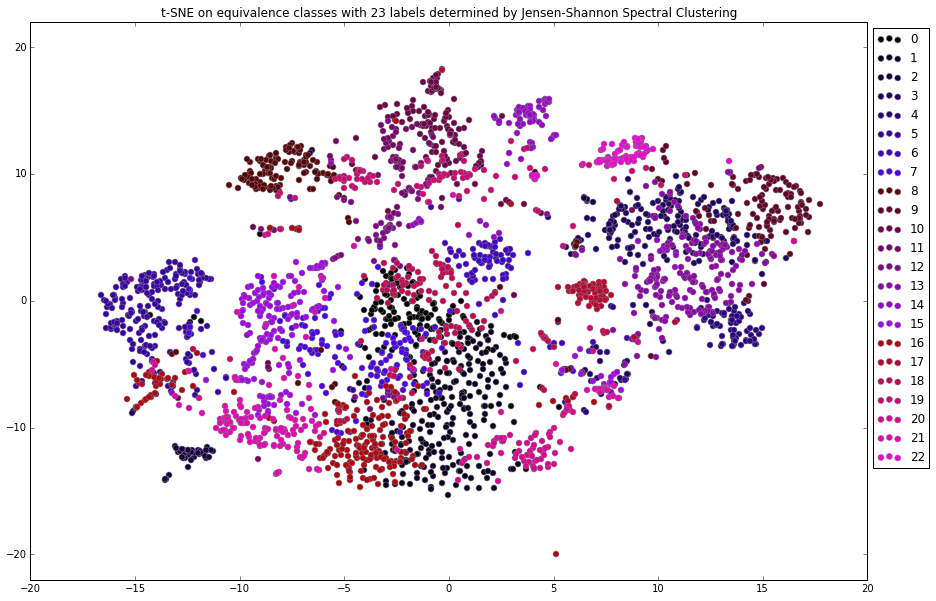

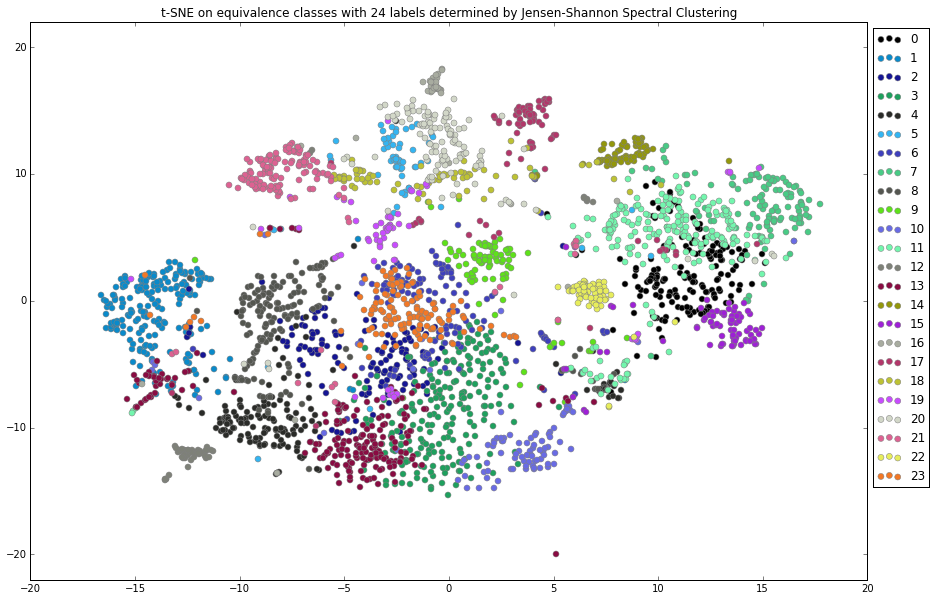

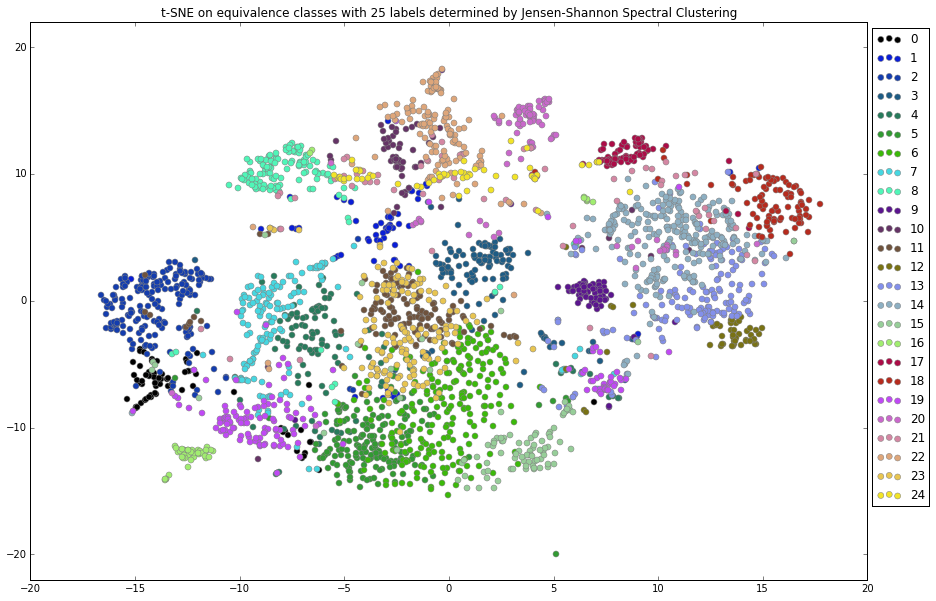

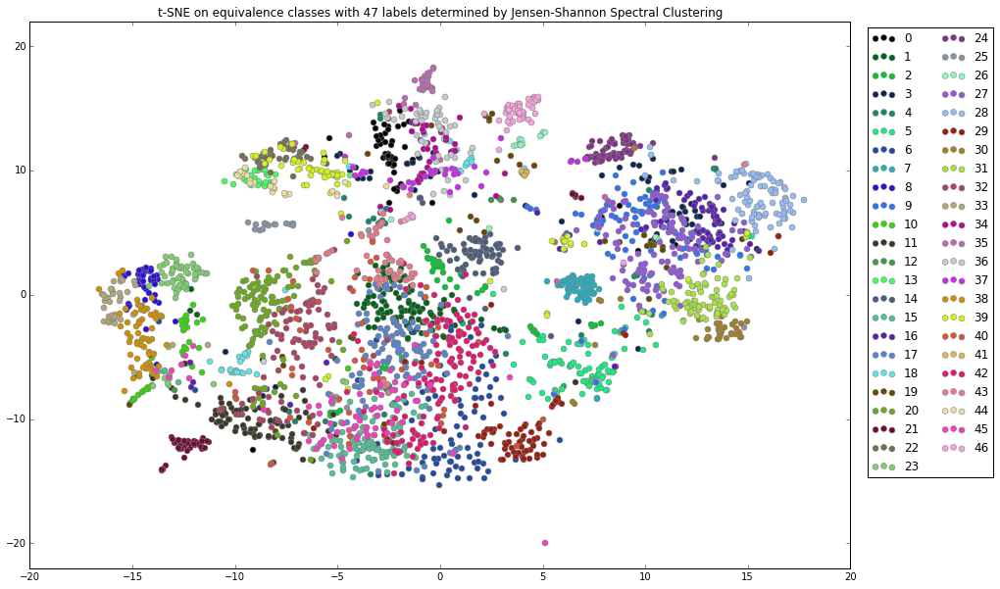

In [266]:
stain_plot(X_tsne,labels_spectral_9,[])
plt.title('t-SNE on equivalence classes with 9 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_10,[])
plt.title('t-SNE on equivalence classes with 10 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)


stain_plot(X_tsne,labels_spectral_11,[])
plt.title('t-SNE on equivalence classes with 11 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_12,[])
plt.title('t-SNE on equivalence classes with 12 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_13,[])
plt.title('t-SNE on equivalence classes with 13 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_14,[])
plt.title('t-SNE on equivalence classes with 14 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_15,[])
plt.title('t-SNE on equivalence classes with 15 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_16,[])
plt.title('t-SNE on equivalence classes with 16 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_17,[])
plt.title('t-SNE on equivalence classes with 17 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_18,[])
plt.title('t-SNE on equivalence classes with 18 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_19,[])
plt.title('t-SNE on equivalence classes with 19 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_20,[])
plt.title('t-SNE on equivalence classes with 20 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_21,[])
plt.title('t-SNE on equivalence classes with 21 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_22,[])
plt.title('t-SNE on equivalence classes with 22 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_23,[])
plt.title('t-SNE on equivalence classes with 23 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_24,[])
plt.title('t-SNE on equivalence classes with 24 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_spectral_25,[])
plt.title('t-SNE on equivalence classes with 25 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)


stain_plot(X_tsne,labels_spectral_47,[])
plt.title('t-SNE on equivalence classes with 47 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.181, 1),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)



## Compare with the 47 cell types privided by the authors:
Notice that our clustering on eq.classes picks up Oligo1 (a new oligodentrocyte type that was reported in the paper)

(-22, 22)

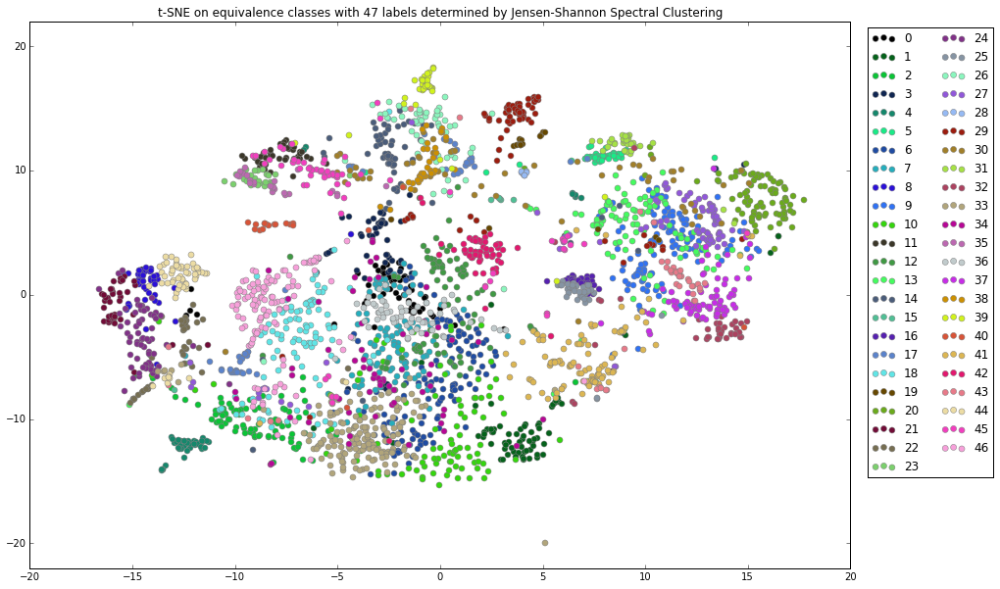

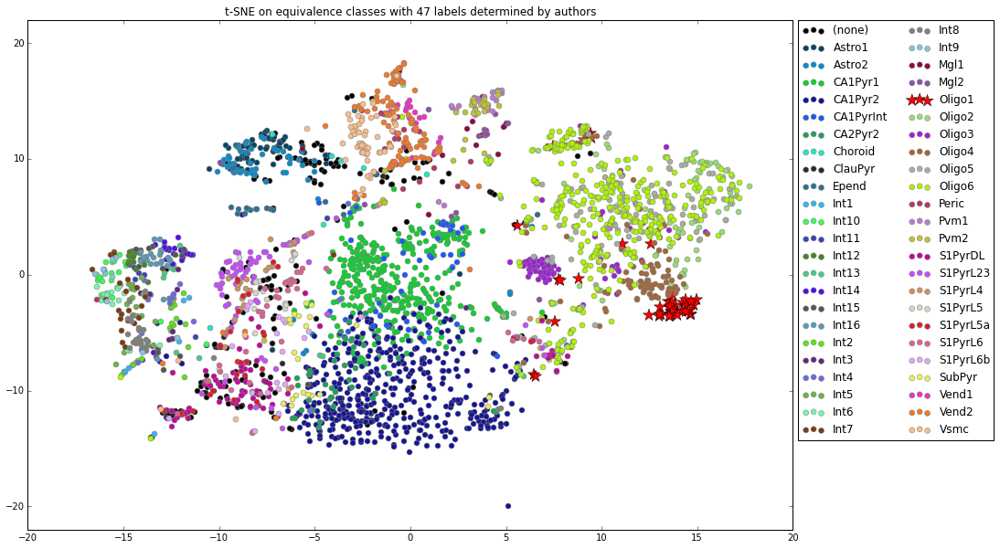

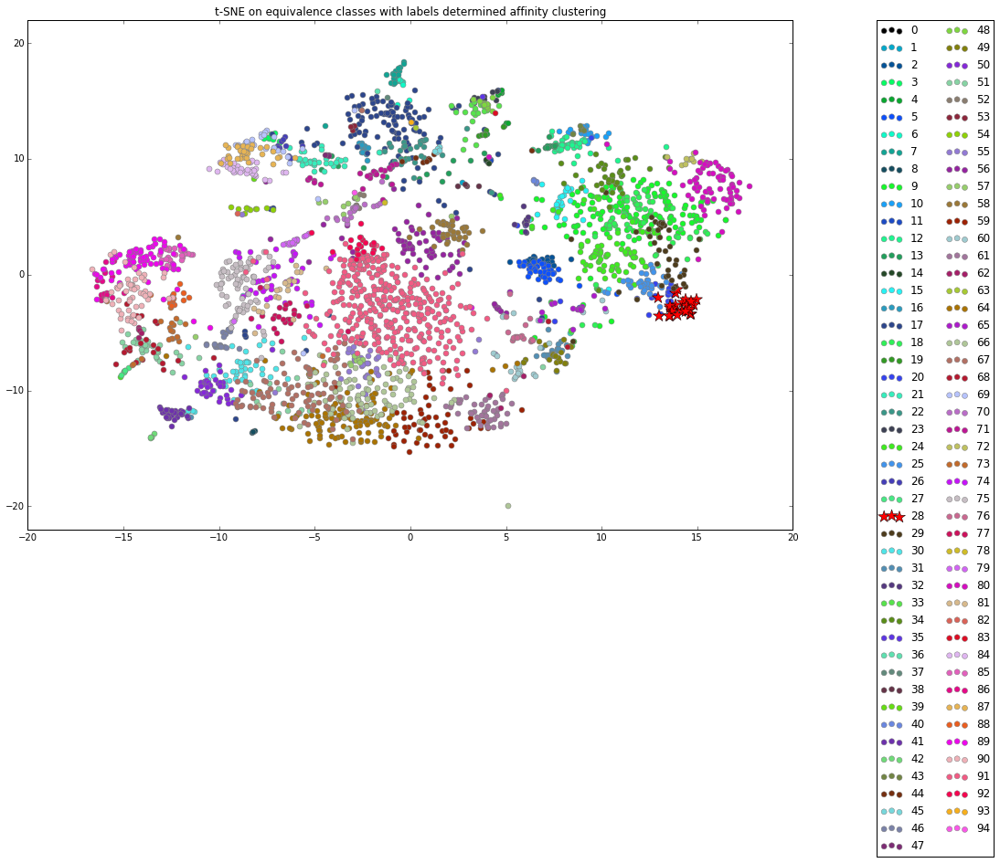

In [17]:
stain_plot(X_tsne,labels_spectral_47,[])
plt.title('t-SNE on equivalence classes with 47 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.181, 1),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_label=['Oligo1']
stain_plot(X_tsne,truth_47,stain_label)
plt.title('t-SNE on equivalence classes with 47 labels determined by authors')
plt.legend(loc='upper right',bbox_to_anchor=(1.27, 1.01),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_affinity,[28])
plt.title('t-SNE on equivalence classes with labels determined affinity clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.27, 1.01),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

In [28]:
labels_affinity_t=vn_AffinityProp(np.exp(- D / D.std()))

(-22, 22)

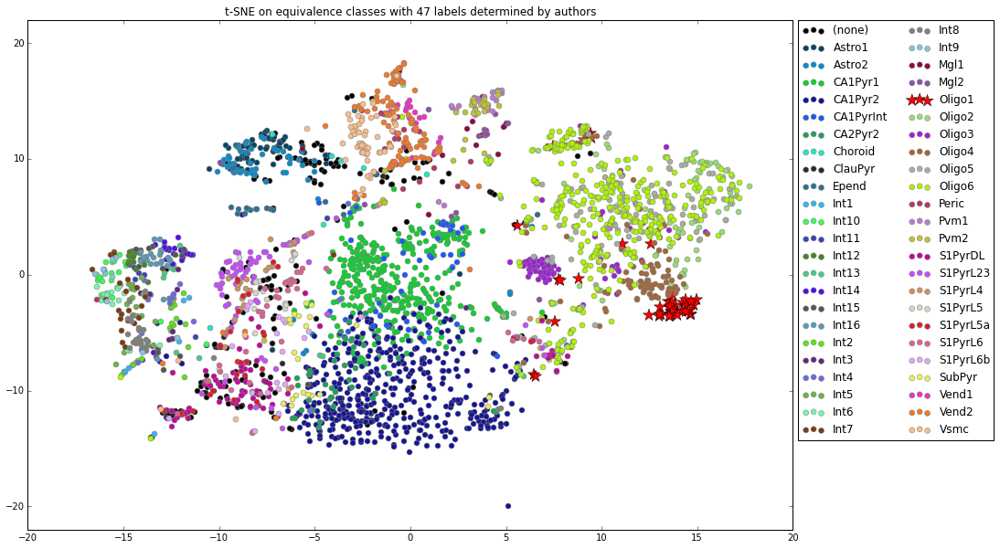

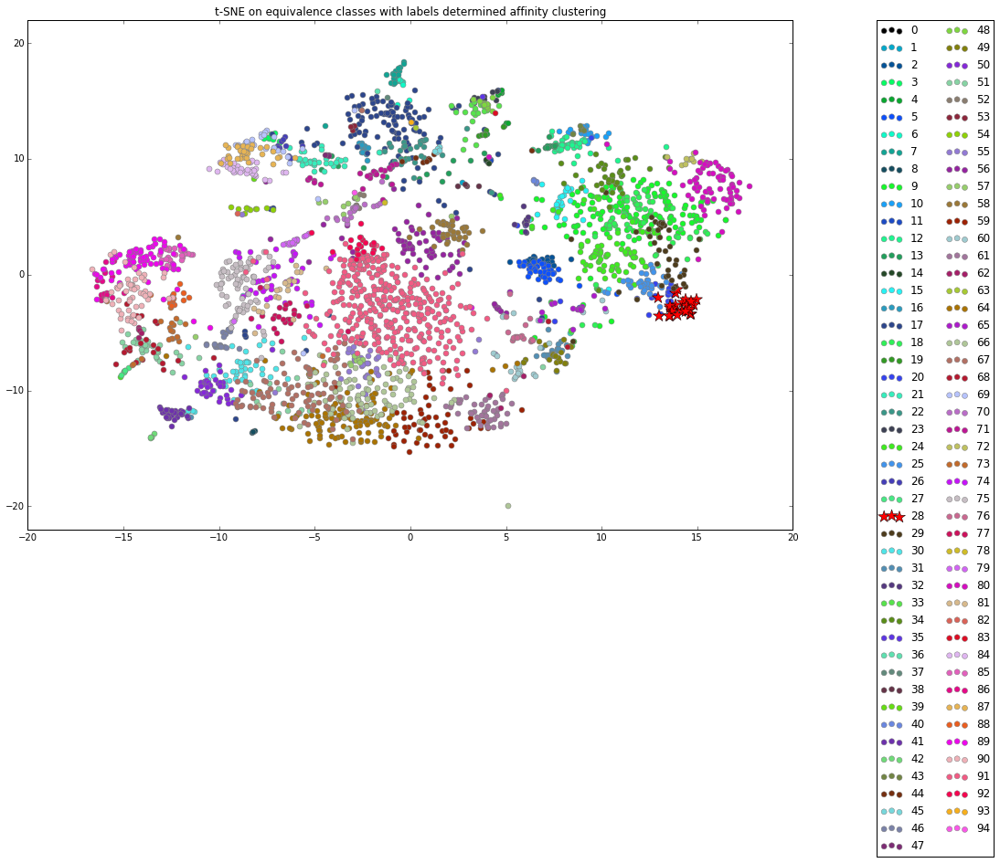

In [29]:
stain_label=['Oligo1']
stain_plot(X_tsne,truth_47,stain_label)
plt.title('t-SNE on equivalence classes with 47 labels determined by authors')
plt.legend(loc='upper right',bbox_to_anchor=(1.27, 1.01),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne,labels_affinity_t,[28])
plt.title('t-SNE on equivalence classes with labels determined affinity clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.27, 1.01),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

## TSP path

In [131]:
with open('/data/SS_RNA_seq/Code/clustering_on_reads/TSP_sol_path.dat', 'rb') as infile:
    TSP_path = pickle.load(infile)

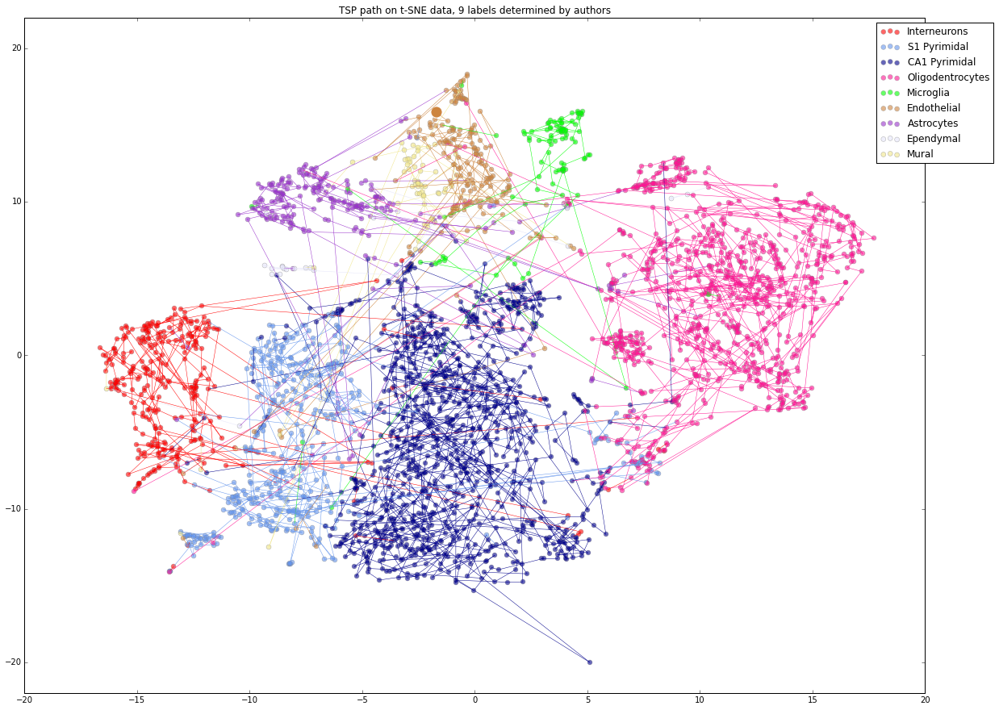

In [142]:
unique_labels = np.unique(truth_9)
plt.figure(figsize=(20,15))
for label in unique_labels:
    ind = np.squeeze(truth_9 == label)
    plt.scatter(X_tsne[ind,0],X_tsne[ind,1],c=color_of_clustID[label.astype(int)],alpha=.6,s=35,edgecolors = 'gray',lw=0.5, label=name_of_clustID[label.astype(int)])

start=0
end=3004
for i in range(start,end):
    plt.plot((X_tsne[TSP_path[i].astype(int),0],X_tsne[TSP_path[i+1].astype(int),0]),(X_tsne[TSP_path[i].astype(int),1],X_tsne[TSP_path[i+1].astype(int),1]),color_of_clustID[truth_9[TSP_path[i].astype(int)].astype(int)],lw=0.5    )         

plt.scatter(X_tsne[TSP_path[start].astype(int),0],X_tsne[TSP_path[start].astype(int),1],s=200,c=color_of_clustID[truth_9[TSP_path[start].astype(int)].astype(int)],alpha=1,edgecolors='white')    
plt.xlim(-20, 20)
plt.ylim(-22, 22)
plt.title('TSP path on t-SNE data, 9 labels determined by authors')    
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)

In [143]:
A=D[TSP_path.astype(int),:]
A=A[:,TSP_path.astype(int)]


<matplotlib.colorbar.Colorbar instance at 0x7f06e209c2d8>

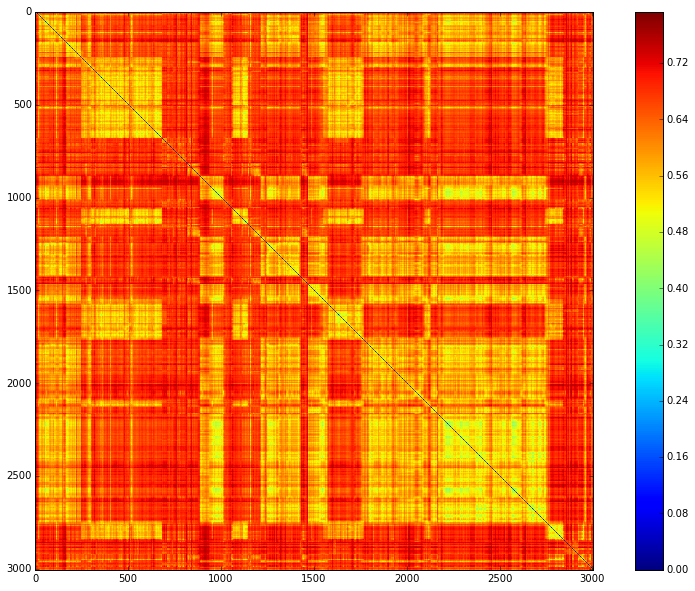

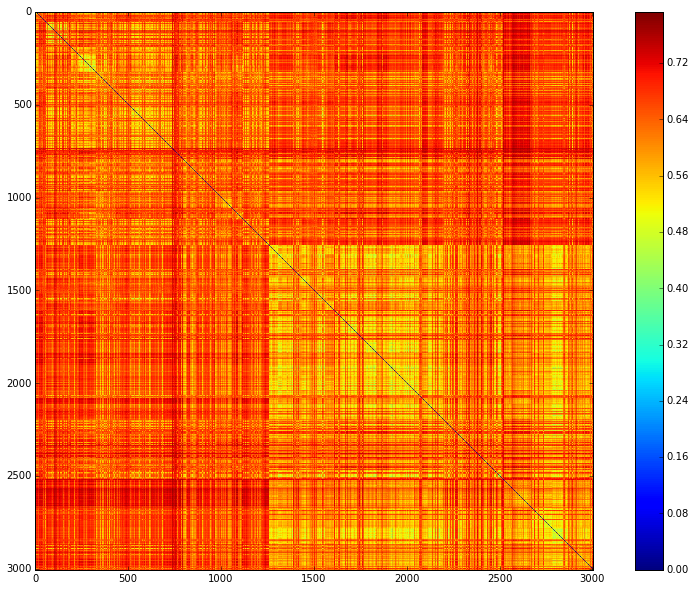

In [176]:

plt.figure(figsize=(15,10))
plt.imshow(A)
plt.colorbar()
indi=range(3005)
#indi = np.squeeze(truth_47 == 'Oligo3')
plt.figure(figsize=(15,10))
plt.imshow(D[np.ix_(indi,indi)])
plt.colorbar()

## Hierarchical Clustering
Generate labels using hierarchical clustering

In [121]:
# test hierarchical clustering.. 

z = jz_hierclust(D)
labels_hc_9 = jz_linkage_to_labels(z,9)

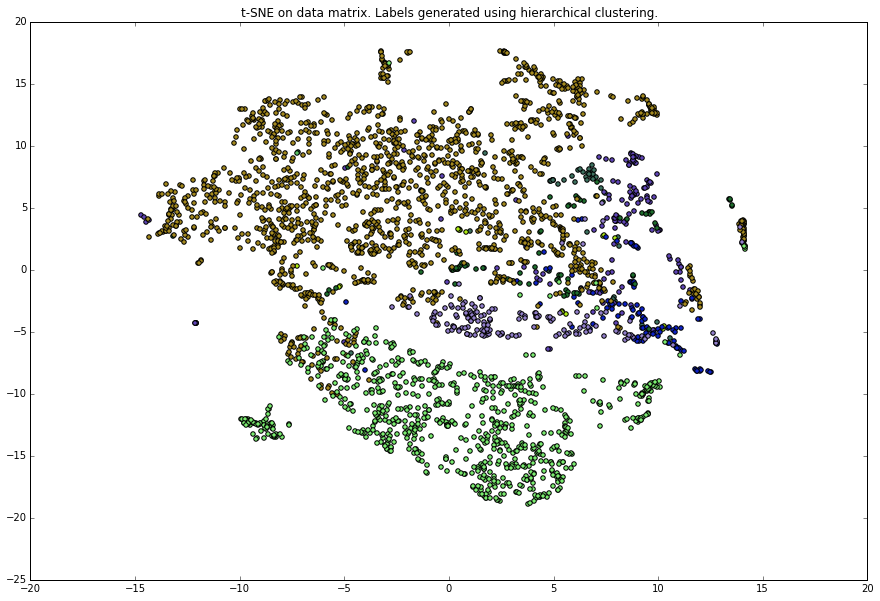

In [122]:
jz_plot(X_tsne,labels_hc_9)
plt.title('t-SNE on data matrix. Labels generated using hierarchical clustering.')

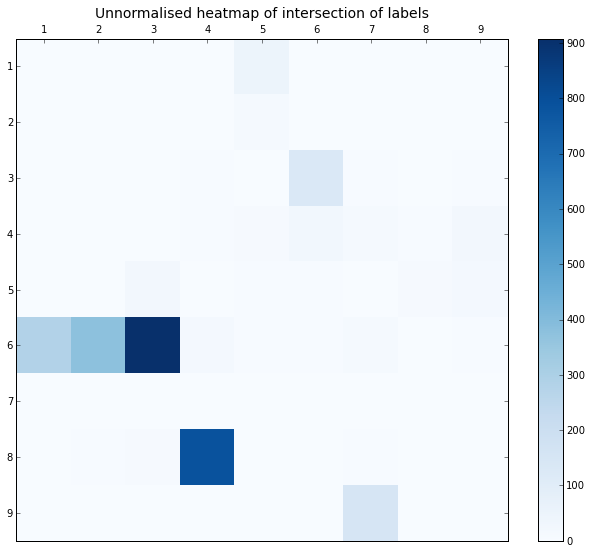

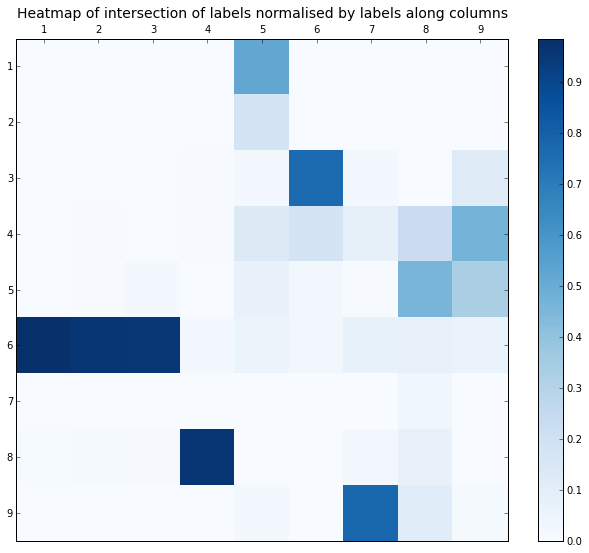

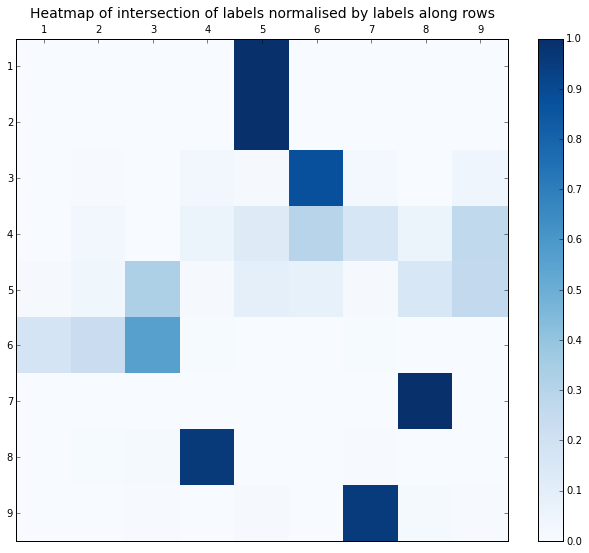

Error rates if best cluster index is picked row-wise : 8.91846921797%.
Error rates if best cluster index is picked column-wise : 29.8169717138%.
Error rates if best cluster index is picked using the Hungarian Algorithm : 30.9484193012%.


In [123]:
analyse_labeling_schemes(labels_hc_9,truth_9)

## Analysis based on Gene Expression Levels

In [30]:
with open('/data/SS_RNA_seq/Code/Zeisel_pairwise_gene_expression.dat','rb') as infile:
    X_gene = pickle.load(infile)

In [37]:
with open('/data/SS_RNA_seq/Code/pairwise_jensen_shannon_gene_expression3', 'rb') as infile:
    DG = pickle.load(infile)

Compute tSNE for Gene Expression

In [38]:
X_tsne_gene = tSNE_pairwise(DG)

In [42]:
sorted_truth_9 = np.sort(truth_9)
print sorted_truth_9
print truth_9

['1' '1' '1' ..., '9' '9' '9']
['4' '4' '4' ..., '1' '3' '3']


In [43]:
with open('/data/SS_RNA_seq/Code/clustering_on_reads/sorted_truth47.txt', 'rb') as infile:
    s=infile.readline()
sorted_truth_47 = np.asarray(s.split())

In [44]:
tru_plot9(X_tsne_gene,sorted_truth_9,color_of_clustID,name_of_clustID)
ind = np.squeeze(truth_tissue == 'ca1hippocampus')
plt.legend(loc='upper right',bbox_to_anchor=(1.19, 1.01))
plt.xlim(-20, 20)
plt.ylim(-22, 22)
plt.scatter(X_tsne_gene[ind,0],X_tsne_gene[ind,1],c='white',alpha=1,s=6,edgecolors = 'none')
plt.title('t-SNE on Gene expression, labeled using the 9 classes provided by the authors -- white dots indicate tissue origin (hippocampus)')


NameError: name 'tru_plot9' is not defined

(-22, 22)

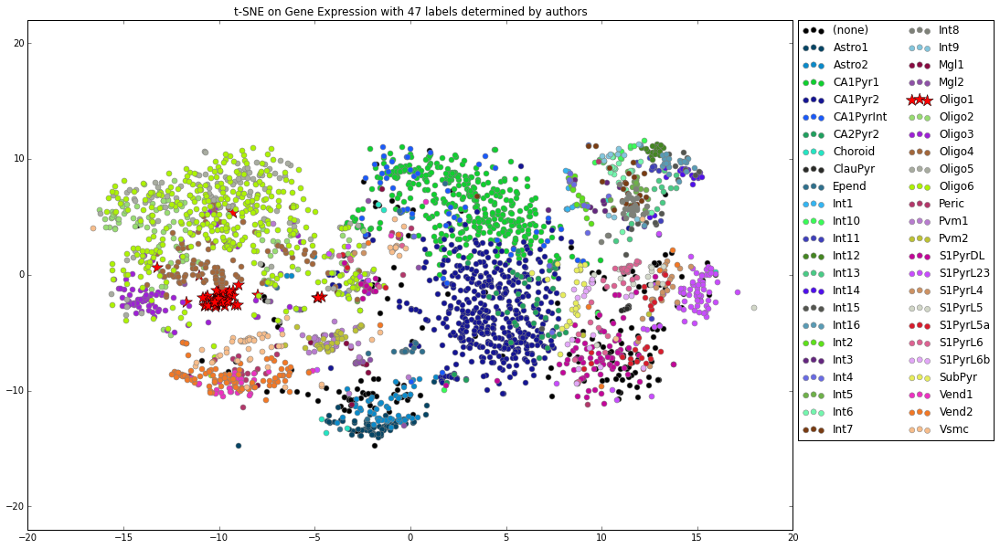

In [45]:
stain_label='Oligo1'
stain_plot(X_tsne_gene,sorted_truth_47,stain_label)
plt.title('t-SNE on Gene Expression with 47 labels determined by authors')
plt.legend(loc='upper right',bbox_to_anchor=(1.27, 1.01),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

<matplotlib.colorbar.Colorbar instance at 0x7f06d1925b48>

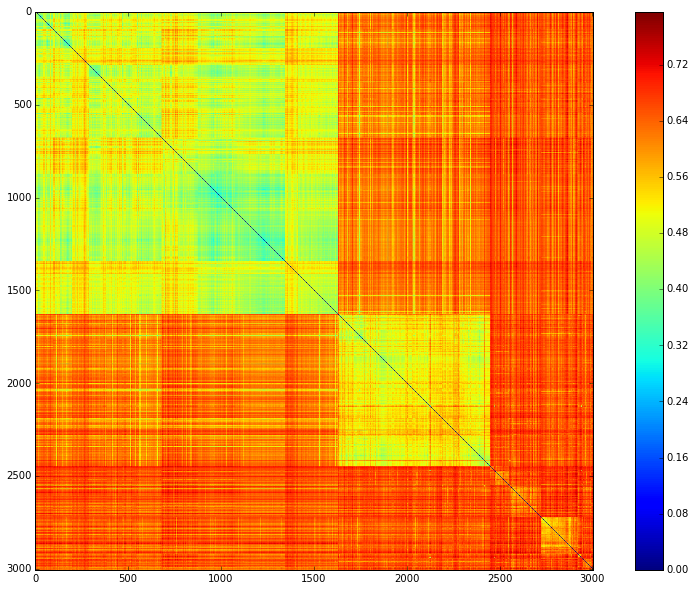

In [199]:
indi=range(3005)
#indi = np.squeeze(truth_9 == '4')
plt.figure(figsize=(15,10))
plt.imshow(DG[np.ix_(indi,indi)])
plt.colorbar()

## Gene DATA

In [180]:
Gene_expr=np.loadtxt('/data/SS_RNA_seq/Zeistel_SM/Zeisel_expression_matrix.txt')

In [181]:
Gene_expr_normalised=Gene_expr.T/np.sum(Gene_expr,axis=1)

In [182]:
Sparse_gene_expr=scipy.sparse.csr_matrix(Gene_expr_normalised.T)

In [183]:
with open('/data/SS_RNA_seq/Code/Zeisel_pairwise_gene_expression.dat','wb') as outfile:
    pickle.dump(Sparse_gene_expr, outfile, pickle.HIGHEST_PROTOCOL)

In [35]:
with open('/data/SS_RNA_seq/Code/pairwise_jensen_shannon_gene_expression.dat', 'rb') as infile:
    DG = pickle.load(infile)

EOFError: 

In [47]:
labels_spectral_gene_9, similarity_matrix_gene=jz_spectral([],9,DG)

In [48]:
labels_spectral_gene, similarity_matrix_gene=jz_spectral([],24,DG)

In [50]:
labels_affinity_gene=vn_AffinityProp(np.exp(- DG / DG.std()))

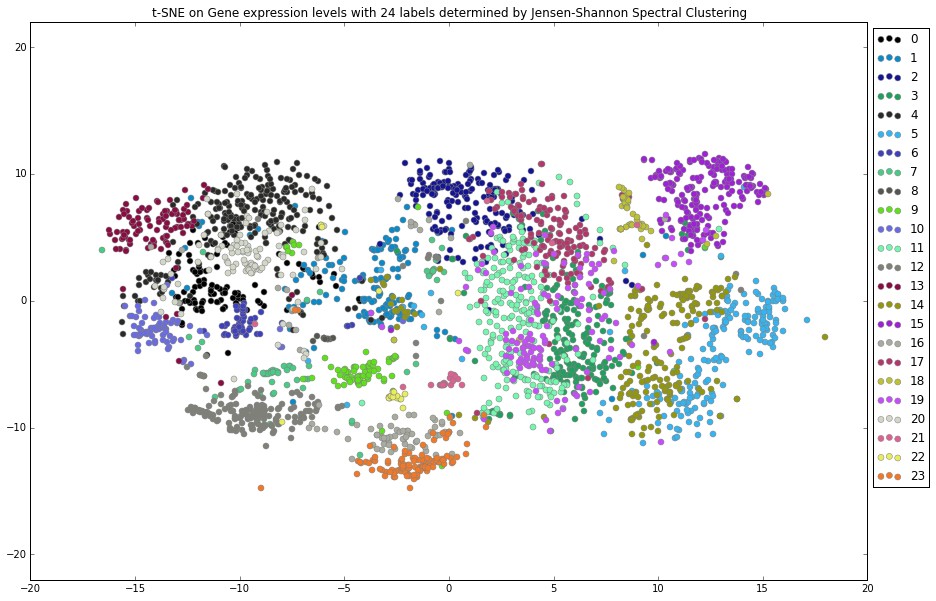

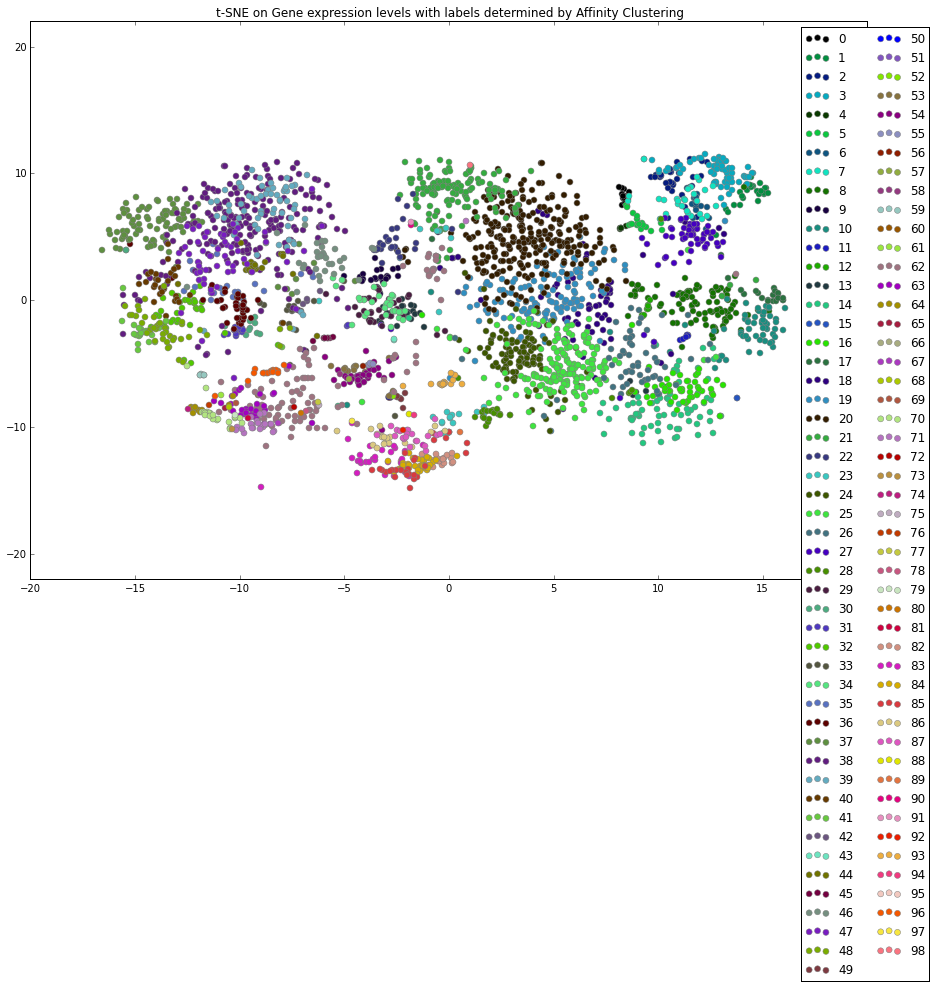

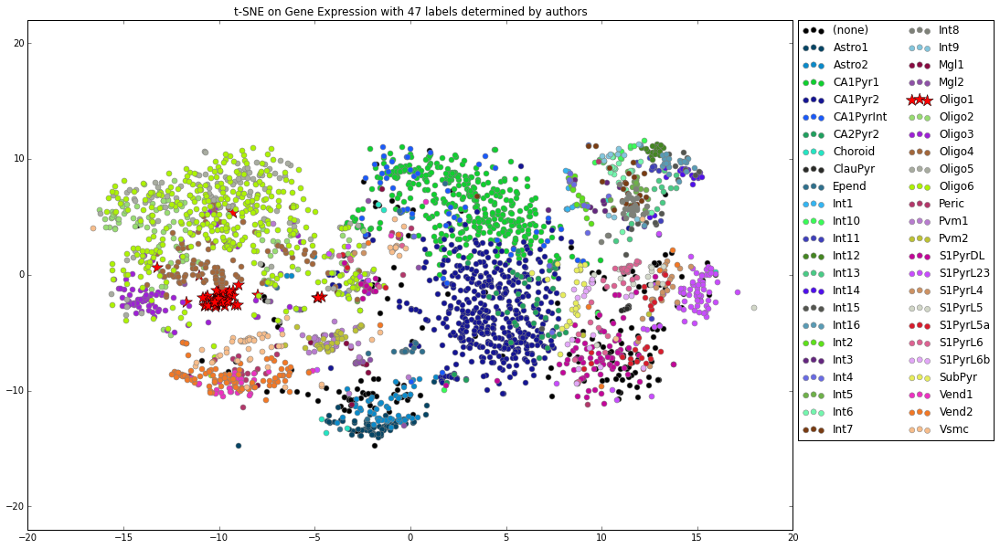

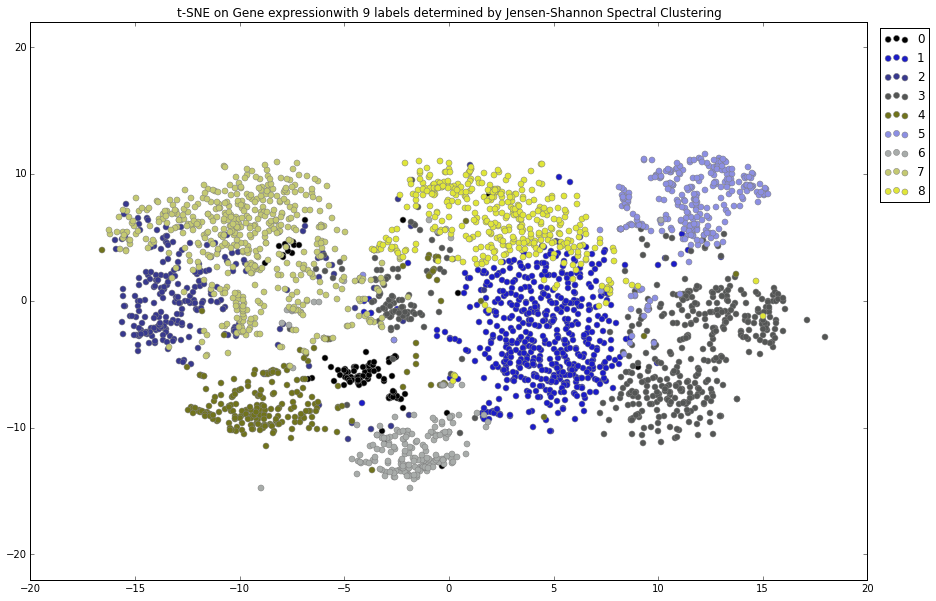

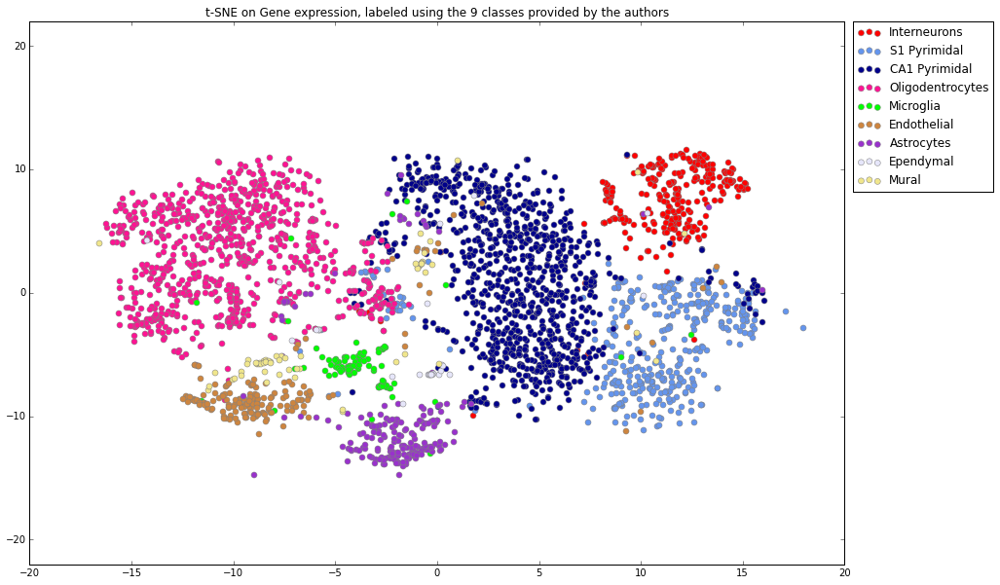

In [54]:
stain_plot(X_tsne_gene,labels_spectral_gene,[])
plt.title('t-SNE on Gene expression levels with 24 labels determined by Jensen-Shannon Spectral Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne_gene,labels_affinity_gene,[])
plt.title('t-SNE on Gene expression levels with labels determined by Affinity Clustering')
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_label='Oligo1'
stain_plot(X_tsne_gene,sorted_truth_47,stain_label)
plt.title('t-SNE on Gene Expression with 47 labels determined by authors')
plt.legend(loc='upper right',bbox_to_anchor=(1.27, 1.01),ncol=2)
plt.xlim(-20, 20)
plt.ylim(-22, 22)

stain_plot(X_tsne_gene,labels_spectral_gene_9,[])
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1)
plt.xlim(-20, 20)
plt.ylim(-22, 22)
plt.title('t-SNE on Gene expressionwith 9 labels determined by Jensen-Shannon Spectral Clustering')

tru_plot9(X_tsne_gene,sorted_truth_9,color_of_clustID,name_of_clustID)
plt.legend(loc='upper right',bbox_to_anchor=(1.19, 1.01))
plt.xlim(-20, 20)
plt.ylim(-22, 22)
plt.title('t-SNE on Gene expression, labeled using the 9 classes provided by the authors')



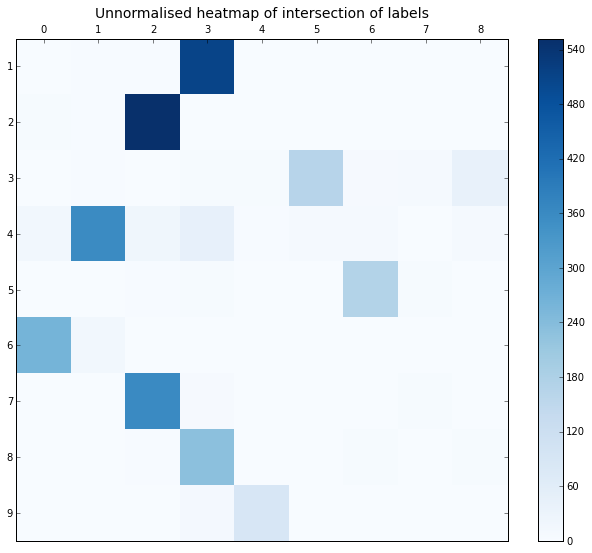

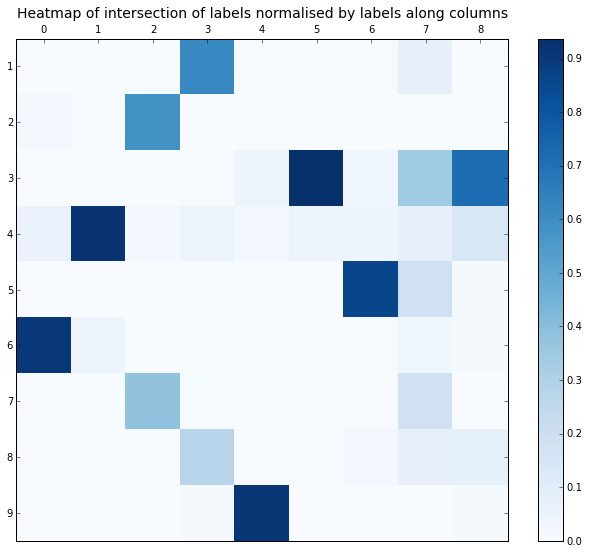

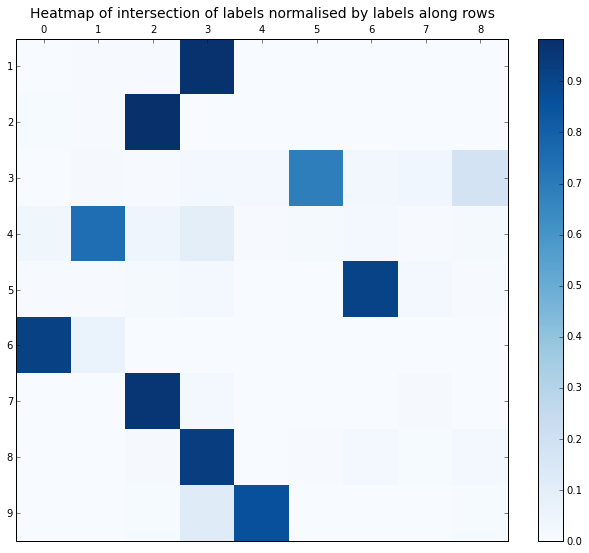

Error rates if best cluster index is picked row-wise : 28.1198003328%.
Error rates if best cluster index is picked column-wise : 10.149750416%.
Error rates if best cluster index is picked using the Hungarian Algorithm : 29.5174708819%.


In [249]:
analyse_labeling_schemes(labels_spectral_gene_9,sorted_truth_9)

In [188]:
evalJS,evecJS= np.linalg.eig(np.diag(np.sum(D_sym,axis=1))-D_sym)

In [189]:
JSevals=sorted(evalJS,reverse=True)

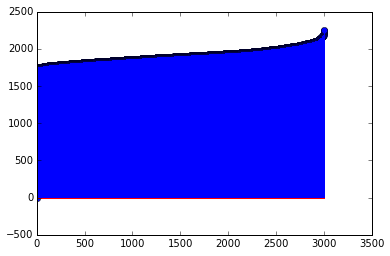

In [190]:
plt.stem(range(len(JSevals)), sorted(JSevals),)
plt.show()

## Comparison -- Gene vs Eq.class clustering


In [293]:
print color_of_clustID[3+1]

deeppink


(-22, 22)

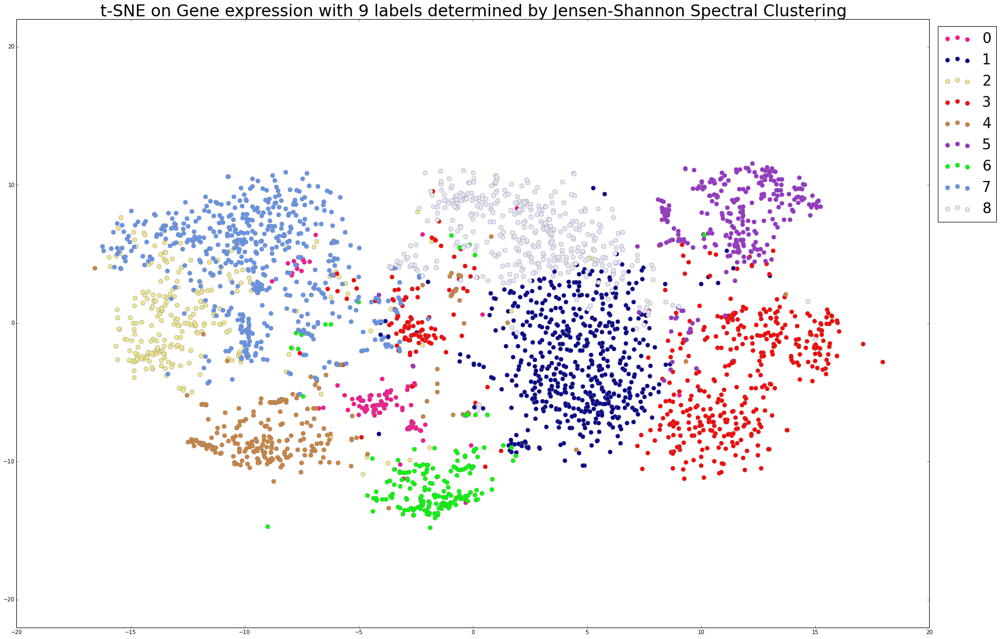

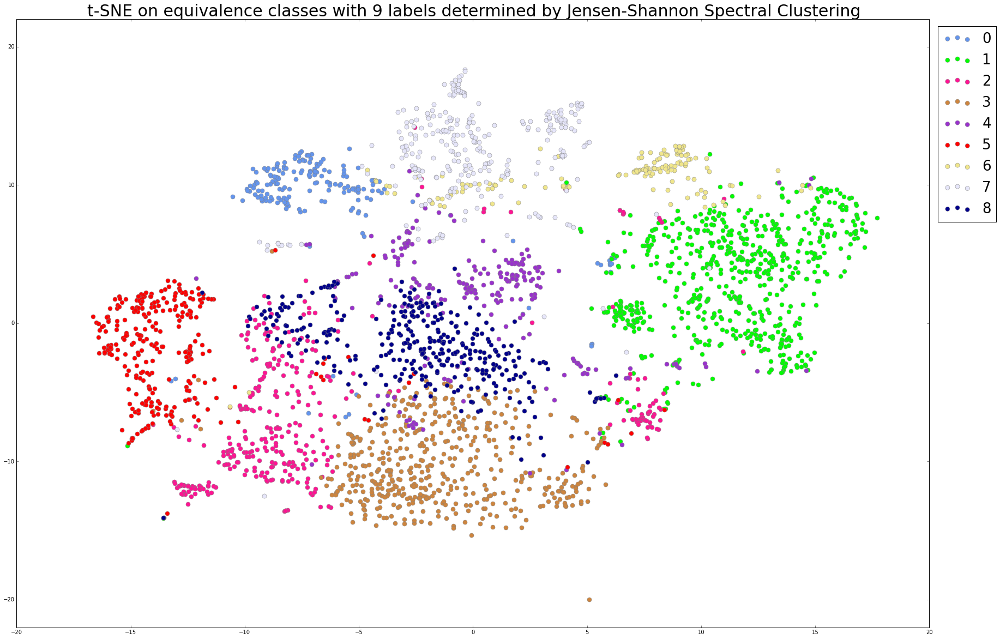

In [57]:
size_of_marker = 36*1.8;
fig = (15*2,10*2)


mapi = {}
mapi[4] =  color_of_clustID[1]
mapi[2] =  color_of_clustID[3]
mapi[7] =  color_of_clustID[5]
mapi[1] =  color_of_clustID[4]
mapi[8] =  color_of_clustID[2]
mapi[5] =  color_of_clustID[6]
mapi[6] =  color_of_clustID[7]
mapi[9] =  color_of_clustID[8]
mapi[3] =  color_of_clustID[9]

unique_labels = np.unique(labels_spectral_gene_9)
i=1;
plt.figure(figsize=fig)
for label in unique_labels:
    ind = np.squeeze(labels_spectral_gene_9 == label)
    plt.scatter(X_tsne_gene[ind,0],X_tsne_gene[ind,1],c=mapi[i],s=size_of_marker,edgecolors='gray',lw = 0.5,label=label)
    i=i+1




## stain with actual colors    
#unique_labels = np.unique(sorted_truth_9)
#for label in unique_labels:
#    ind = np.squeeze(sorted_truth_9 == label)
#    plt.scatter(X_tsne_gene[ind,0],X_tsne_gene[ind,1],c=color_of_clustID[label.astype(int)],s=10,alpha=1,edgecolors='None',lw = 0.5, label=name_of_clustID[label.astype(int)])        
#    plt.legend(loc='upper right',bbox_to_anchor=(1.1, 1))

#plt.scatter(X_tsne_gene[ind,0],X_tsne_gene[ind,1],c='white',alpha=1,s=6,edgecolors = 'none')
plt.title('t-SNE on Gene expression with 9 labels determined by Jensen-Shannon Spectral Clustering',**{'fontsize':30})
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1,**{'fontsize':26})
plt.xlim(-20, 20)
plt.ylim(-22, 22)





#stain_plot(X_tsne,labels_spectral_9,[])
mapi = {}
mapi[3] =  color_of_clustID[4]
mapi[4] =  color_of_clustID[6]
mapi[2] =  color_of_clustID[5]
mapi[6] =  color_of_clustID[1]
mapi[9] =  color_of_clustID[3]
mapi[5] =  color_of_clustID[7]
mapi[1] =  color_of_clustID[2]
mapi[8] =  color_of_clustID[8]
mapi[7] =  color_of_clustID[9]



unique_labels = np.unique(labels_spectral_9)
i=1;
plt.figure(figsize=fig)
for label in unique_labels:
    ind = np.squeeze(labels_spectral_9 == label)
    plt.scatter(X_tsne[ind,0],X_tsne[ind,1],c=mapi[i],s=size_of_marker,edgecolors='gray',lw = 0.5,label=label)
    i=i+1



#truth_9 = np.loadtxt('/data/SS_RNA_seq/Code/clustering_on_reads/metadata/cell_group_num_3005.txt',dtype=str)


## stain with actual colors    

#unique_labels = np.unique(truth_9)
#for label in unique_labels:
#   ind = np.squeeze(truth_9 == label)
#   plt.scatter(X_tsne[ind,0],X_tsne[ind,1],c='None',s=56,alpha=1,edgecolors=color_of_clustID[label.astype(int)],lw = 0.5, label=name_of_clustID[label.astype(int)])        
#    plt.legend(loc='upper right',bbox_to_anchor=(1.1, 1))

##plt.scatter(X_tsne_gene[ind,0],X_tsne_gene[ind,1],c='white',alpha=1,s=6,edgecolors = 'none')
plt.title('t-SNE on equivalence classes with 9 labels determined by Jensen-Shannon Spectral Clustering',**{'fontsize':30})
plt.legend(loc='upper right',bbox_to_anchor=(1.081, 1),ncol=1,**{'fontsize':26})
plt.xlim(-20, 20)
plt.ylim(-22, 22)
